## Data Analysis - 5Year 

In [0]:
from pyspark.sql.functions import col, sum as _sum, when
import pandas as pd
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
from pyspark.sql.types import NumericType
from pyspark.sql.types import *

from pyspark.sql.window import Window
from pyspark.sql.functions import col, row_number

import matplotlib.pyplot as plt



import seaborn as sns

In [0]:
section = "4"
number = "1"
folder_path = f"dbfs:/student-groups/Group_{section}_{number}"
dbutils.fs.mkdirs(folder_path)


True

In [0]:
#dbfs:/mnt/mids-w261/OTPW_60M/

data_BASE_DIR = "dbfs:/mnt/mids-w261/OTPW_60M_Backup/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))


path,name,size,modificationTime
dbfs:/mnt/mids-w261/OTPW_60M_Backup/_SUCCESS,_SUCCESS,0,1744495305000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/_committed_6865934896646357313,_committed_6865934896646357313,524,1744495306000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/_started_6865934896646357313,_started_6865934896646357313,0,1744495305000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/part-00000-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-133-1.c000.snappy.parquet,part-00000-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-133-1.c000.snappy.parquet,1385705174,1744495305000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/part-00001-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-134-1.c000.snappy.parquet,part-00001-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-134-1.c000.snappy.parquet,1356469888,1744496514000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/part-00002-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-135-1.c000.snappy.parquet,part-00002-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-135-1.c000.snappy.parquet,1092710849,1744497469000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/part-00003-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-136-1.c000.snappy.parquet,part-00003-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-136-1.c000.snappy.parquet,1045217237,1744498247000
dbfs:/mnt/mids-w261/OTPW_60M_Backup/part-00004-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-137-1.c000.snappy.parquet,part-00004-tid-6865934896646357313-d0d2f795-a1f4-4e99-baf6-57bbbfdcabaa-137-1.c000.snappy.parquet,1030144723,1744499059000


In [0]:
df_60m = spark.read.parquet("dbfs:/mnt/mids-w261/OTPW_60M_Backup/")


# Total rows and columns
print(f"Rows: {df_60m.count():,}")
print(f"Columns: {len(df_60m.columns)}")

# Schema information
df_60m.printSchema()

display(df_60m.limit(5))

Rows: 31,673,119
Columns: 214
root
 |-- QUARTER: string (nullable = true)
 |-- DAY_OF_MONTH: string (nullable = true)
 |-- DAY_OF_WEEK: string (nullable = true)
 |-- FL_DATE: string (nullable = true)
 |-- OP_UNIQUE_CARRIER: string (nullable = true)
 |-- OP_CARRIER_AIRLINE_ID: string (nullable = true)
 |-- OP_CARRIER: string (nullable = true)
 |-- TAIL_NUM: string (nullable = true)
 |-- OP_CARRIER_FL_NUM: string (nullable = true)
 |-- ORIGIN_AIRPORT_ID: string (nullable = true)
 |-- ORIGIN_AIRPORT_SEQ_ID: string (nullable = true)
 |-- ORIGIN_CITY_MARKET_ID: string (nullable = true)
 |-- ORIGIN: string (nullable = true)
 |-- ORIGIN_CITY_NAME: string (nullable = true)
 |-- ORIGIN_STATE_ABR: string (nullable = true)
 |-- ORIGIN_STATE_FIPS: string (nullable = true)
 |-- ORIGIN_STATE_NM: string (nullable = true)
 |-- ORIGIN_WAC: string (nullable = true)
 |-- DEST_AIRPORT_ID: string (nullable = true)
 |-- DEST_AIRPORT_SEQ_ID: string (nullable = true)
 |-- DEST_CITY_MARKET_ID: string (nullable

QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,YEAR,MONTH,origin_airport_name,origin_station_name,origin_station_id,origin_iata_code,origin_icao,origin_type,origin_region,origin_station_lat,origin_station_lon,origin_airport_lat,origin_airport_lon,origin_station_dis,dest_airport_name,dest_station_name,dest_station_id,dest_iata_code,dest_icao,dest_type,dest_region,dest_station_lat,dest_station_lon,dest_airport_lat,dest_airport_lon,dest_station_dis,sched_depart_date_time_UTC,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurati

In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261/OTPW_60M_Backup/"

# List all files inside the folder
files = dbutils.fs.ls(data_BASE_DIR)

total_bytes = sum([f.size for f in files])

size_gb = total_bytes / (1024**3)  # convert bytes → GB

print(f"Total size: {size_gb:.3f} GB")



Total size: 5.504 GB


In [0]:

# Columns to summarize
numeric_cols = [
    "DEP_DELAY",
    "DEP_DELAY_NEW",
    "DEP_DELAY_GROUP",
    "TAXI_OUT",
    "WHEELS_OFF",
    "DEP_TIME",
    "CRS_DEP_TIME"
]

# 1. Summary stats for numeric fields
summary_stats = (
    df_60m.select(numeric_cols)
      .summary("count", "mean", "stddev", "min", "25%", "50%", "75%", "max")
)

summary_stats.show(truncate=False)

# 2. DEP_DEL15 (Binary) — only percentage of 1's
dep_del15_stats = (
    df_60m.select(
        F.mean(F.col("DEP_DEL15")).alias("pct_delayed_over_15min")
    )
)

dep_del15_stats.show()


+-------+-----------------+------------------+-------------------+-----------------+------------------+------------------+------------------+
|summary|DEP_DELAY        |DEP_DELAY_NEW     |DEP_DELAY_GROUP    |TAXI_OUT         |WHEELS_OFF        |DEP_TIME          |CRS_DEP_TIME      |
+-------+-----------------+------------------+-------------------+-----------------+------------------+------------------+------------------+
|count  |31197330         |31197330          |31197330           |31188227         |31188232          |31202304          |31673119          |
|mean   |9.845084082516037|12.898337293608138|0.03540024098216097|16.83594492242217|1357.3536174477604|1334.6024040404195|1330.4922129393067|
|stddev |43.47592737302716|42.41304716018581 |2.161103482489557  |9.490159840086232|504.38642767548066|502.73883312205106|489.2756896602081 |
|min    |-1.0             |0.0               |-1                 |1.0              |1                 |1                 |1                 |
|25%  

In [0]:


# Columns to summarize
numeric_cols = [
    "HourlyAltimeterSetting",
    "HourlySeaLevelPressure",
    "HourlyStationPressure",
    "HourlyPressureChange",
    "HourlyPressureTendency"
]

# 1. Summary stats for numeric fields
summary_stats = (
    df_60m.select([col if col != 'HourlySeaLevelPressure' else 'HourlySeaLevelPressure' for col in numeric_cols])
      .summary("count", "mean", "stddev", "min", "25%", "50%", "75%", "max")
)

summary_stats.show(truncate=False)



+-------+----------------------+----------------------+---------------------+---------------------+----------------------+
|summary|HourlyAltimeterSetting|HourlySeaLevelPressure|HourlyStationPressure|HourlyPressureChange |HourlyPressureTendency|
+-------+----------------------+----------------------+---------------------+---------------------+----------------------+
|count  |30342858              |28625465              |31351710             |10858230             |10858230              |
|mean   |30.027162676959634    |30.01842552855688     |29.151376062007827   |0.0019882367557361325|4.432055040278204     |
|stddev |0.1884299206587572    |0.19814190772665466   |1.3187392222180754   |0.04218443010256577  |2.8249055955296645    |
|min    |27.99                 |28.36                 |19.79                |+                    |0                     |
|25%    |29.91                 |29.9                  |29.05                |-0.03                |2.0                   |
|50%    |30.02  

In [0]:


# Columns to summarize
numeric_cols = [
    "HourlyDryBulbTemperature", "HourlyWetBulbTemperature" , "HourlyDewPointTemperature" , "HourlyRelativeHumidity",
"HourlyWindDirection", "HourlyWindSpeed","HourlyWindGustSpeed", "HourlyVisibility", "HourlyPrecipitation"
]

# 1. Summary stats for numeric fields
summary_stats = (
    df_60m.select(numeric_cols)
      .summary("count", "mean", "stddev", "min", "25%", "50%", "75%", "max")
)

summary_stats.show(truncate=False)



+-------+------------------------+------------------------+-------------------------+----------------------+-------------------+-----------------+-------------------+------------------+---------------------+
|summary|HourlyDryBulbTemperature|HourlyWetBulbTemperature|HourlyDewPointTemperature|HourlyRelativeHumidity|HourlyWindDirection|HourlyWindSpeed  |HourlyWindGustSpeed|HourlyVisibility  |HourlyPrecipitation  |
+-------+------------------------+------------------------+-------------------------+----------------------+-------------------+-----------------+-------------------+------------------+---------------------+
|count  |31598028                |31338808                |31591566                 |31590652              |31536650           |31583390         |4157530            |31601856          |28051778             |
|mean   |63.88077952897216       |55.216059230971545      |47.57805096259933        |60.555352574205244    |177.50963524727135 |9.085087787929593|25.436238460937076 |9.

## Data for the Project

In [0]:

# Separate column names by data type
numeric_cols = [c for c, t in df_60m.dtypes if t in ("int", "double", "float", "bigint", "long")]
categorical_cols = [c for c, t in df_60m.dtypes if t in ("string",)]
datetime_cols = [c for c, t in df_60m.dtypes if t in ("timestamp", "date")]

print("Numeric Columns:", len(numeric_cols))
print("Categorical Columns:", len(categorical_cols))
print("Datetime Columns:", len(datetime_cols))

print("\nList of Numeric Columns:")
print(numeric_cols)

print("\nList of Categorical Columns:")
print(categorical_cols)

print("\nList of Datetime Columns:")
print(datetime_cols)


Numeric Columns: 0
Categorical Columns: 214
Datetime Columns: 0

List of Numeric Columns:
[]

List of Categorical Columns:
['QUARTER', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'FL_DATE', 'OP_UNIQUE_CARRIER', 'OP_CARRIER_AIRLINE_ID', 'OP_CARRIER', 'TAIL_NUM', 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID', 'ORIGIN', 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'ORIGIN_STATE_FIPS', 'ORIGIN_STATE_NM', 'ORIGIN_WAC', 'DEST_AIRPORT_ID', 'DEST_AIRPORT_SEQ_ID', 'DEST_CITY_MARKET_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_STATE_FIPS', 'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME', 'DEP_TIME', 'DEP_DELAY', 'DEP_DELAY_NEW', 'DEP_DEL15', 'DEP_DELAY_GROUP', 'DEP_TIME_BLK', 'TAXI_OUT', 'WHEELS_OFF', 'WHEELS_ON', 'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW', 'ARR_DEL15', 'ARR_DELAY_GROUP', 'ARR_TIME_BLK', 'CANCELLED', 'CANCELLATION_CODE', 'DIVERTED', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'FLIGHTS', 'DISTANCE', 'DISTANCE_GR

### **_Check Duplicates - 1 row per flight_**

In [0]:
#DEP_DELAY_NEW

# ---------- Find Duplicates ----------
dup_key = ["FL_DATE", "OP_CARRIER_FL_NUM", "ORIGIN", "DEST", "CRS_DEP_TIME"]

dups = (df_60m
        .groupBy(dup_key)
        .count()
        .filter(F.col("count") > 1)
        .orderBy(F.desc("count")))

print("Number of duplicate key groups:", dups.count())
display(dups)  # show examples


Number of duplicate key groups: 62


FL_DATE,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,count
2015-03-04,415,JFK,SFO,1630,2
2015-03-28,415,JFK,SFO,1630,2
2015-10-15,112,ORD,BOS,1930,2
2015-04-20,415,JFK,SFO,1630,2
2015-03-31,415,JFK,SFO,1630,2
2015-03-19,415,JFK,SFO,1630,2
2015-03-01,415,JFK,SFO,1630,2
2015-03-03,415,JFK,SFO,1630,2
2015-03-27,415,JFK,SFO,1630,2
2015-04-24,415,JFK,SFO,1630,2


### Duplicate Analysis

In [0]:


dup_key = ["FL_DATE", "OP_CARRIER_FL_NUM", "ORIGIN", "DEST", "CRS_DEP_TIME"]



#quick counts before
before_count = df_60m.count()
dup_groups_count = (df_60m.groupBy(dup_key).count().filter(F.col("count") > 1).count())
print(f"Total rows before: {before_count:,}")
print(f"Duplicate groups found: {dup_groups_count:,}")

# create an integer DEP_TIME helper (nulls -> -1 so they sort last)
df_tmp = df_60m.withColumn(
    "DEP_TIME_int",
    F.when(F.col("DEP_TIME").isNull(), F.lit(-1)).otherwise(F.col("DEP_TIME").cast("int"))
)

# window to keep latest DEP_TIME (highest DEP_TIME_int)
w = Window.partitionBy(*dup_key).orderBy(col("DEP_TIME_int").desc())

# rank and filter
df_ranked = df_tmp.withColumn("rn", row_number().over(w))

# # inspect rows that would be removed for a few groups
# to_remove = df_ranked.filter(F.col("rn") > 1)
# print("Example rows that will be removed (showing up to 20):")
# display(to_remove.select(*dup_key, "DEP_TIME", "DEP_TIME_int", "DEP_DELAY", "ARR_TIME", "ARR_DELAY").limit(20))

# 6) keep top row per group
df_dedup = df_ranked.filter(F.col("rn") == 1).drop("rn", "DEP_TIME_int")

# 7) counts after and sanity check
after_count = df_dedup.count()
print(f"Total rows after dedup: {after_count:,}")
print(f"Rows removed: {before_count - after_count:,}")

# 8) verify there are no duplicate groups left
remaining_dup_groups = (df_dedup.groupBy(dup_key).count().filter(F.col("count") > 1).count())
print(f"Duplicate groups remaining after dedup: {remaining_dup_groups}")



Total rows before: 31,673,119
Duplicate groups found: 174
Total rows after dedup: 31,672,945
Rows removed: 174
Duplicate groups remaining after dedup: 0


In [0]:

# Find duplicate groups and pick 2 sample keys
sample_groups = (df_otpw
    .groupBy(dup_key)
    .count()
    .filter(F.col("count") > 1)
    .limit(2)   #  only 2 groups for your examples
    .collect()
)
sample_groups


for g in sample_groups:
    print("\nDuplicate Example Group:")
    print(f"FL_DATE={g.FL_DATE}, Flight={g.OP_CARRIER_FL_NUM}, {g.ORIGIN}->{g.DEST}, CRS_DEP_TIME={g.CRS_DEP_TIME}")

    display(
        df_otpw.filter(
            (col("FL_DATE") == g.FL_DATE) &
            (col("OP_CARRIER_FL_NUM") == g.OP_CARRIER_FL_NUM) &
            (col("ORIGIN") == g.ORIGIN) &
            (col("DEST") == g.DEST) &
            (col("CRS_DEP_TIME") == g.CRS_DEP_TIME)
        ).select(
            *dup_key, "DEP_TIME", "DEP_DELAY", "ARR_TIME", "ARR_DELAY", "TAIL_NUM"
        )
    )



Duplicate Example Group:
FL_DATE=2015-05-27, Flight=47, ORD->PDX, CRS_DEP_TIME=1025


FL_DATE,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,ARR_TIME,ARR_DELAY,TAIL_NUM
2015-05-27,47,ORD,PDX,1025,1024,-1.0,1226,-29.0,N3CCAA
2015-05-27,47,ORD,PDX,1025,1024,-1.0,1226,-29.0,N3CCAA



Duplicate Example Group:
FL_DATE=2015-06-27, Flight=64, MIA->JFK, CRS_DEP_TIME=1240


FL_DATE,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,ARR_TIME,ARR_DELAY,TAIL_NUM
2015-06-27,64,MIA,JFK,1240,1237,-3.0,1527,-17.0,N866AA
2015-06-27,64,MIA,JFK,1240,1237,-3.0,1527,-17.0,N866AA


### **_Missing Value Analysis_**

In [0]:

total_rows = df_dedup.count()

# Compute null count and percentage per column
null_summary = df_dedup.select([
    _sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_dedup.columns
]).toPandas().T.reset_index()

null_summary.columns = ["Column", "Null_Count"] 
null_summary["Null_%"] = (null_summary["Null_Count"] / total_rows * 100).round(2)

# Sort by highest missing percentage
null_summary = null_summary.sort_values(by="Null_%", ascending=False).reset_index(drop=True)

display(null_summary)


Column,Null_Count,Null_%
ShortDurationPrecipitationValue180,31672945,100.0
ShortDurationPrecipitationValue010,31672945,100.0
ShortDurationPrecipitationValue015,31672945,100.0
MonthlyDaysWithGT001Precip,31672945,100.0
MonthlyDaysWithGT010Precip,31672945,100.0
MonthlyDaysWithGT32Temp,31672945,100.0
MonthlyDaysWithGT90Temp,31672945,100.0
MonthlyDaysWithLT0Temp,31672945,100.0
MonthlyDaysWithLT32Temp,31672945,100.0
ShortDurationEndDate100,31672945,100.0


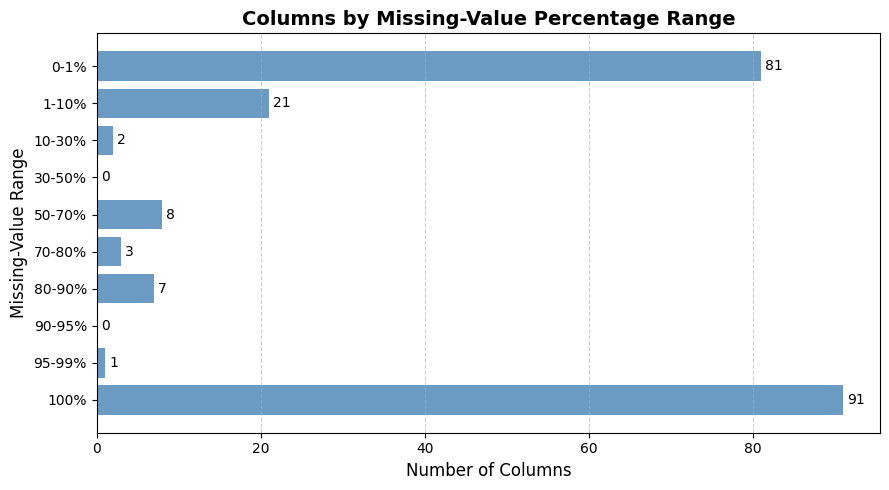

In [0]:
# Defining bins 
bins = [0, 1, 10, 30, 50, 70, 80, 90, 95, 99, 100.1]
labels = [
    "0-1%", "1-10%", "10-30%", "30-50%",
    "50-70%", "70-80%", "80-90%", "90-95%",
    "95-99%", "100%"
]

# Bin and count
null_summary["MissingRange"] = pd.cut(null_summary["Null_%"], bins=bins, labels=labels, right=False)
bucket_counts = null_summary["MissingRange"].value_counts().sort_index().reset_index()
bucket_counts.columns = ["MissingRange", "NumColumns"]

# Plot
plt.figure(figsize=(9,5))
plt.barh(bucket_counts["MissingRange"], bucket_counts["NumColumns"], color="steelblue", alpha=0.8)
plt.title("Columns by Missing-Value Percentage Range", fontsize=14, weight="bold")
plt.xlabel("Number of Columns", fontsize=12)
plt.ylabel("Missing-Value Range", fontsize=12)
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.gca().invert_yaxis()  # highest bucket on top
for i, v in enumerate(bucket_counts["NumColumns"]):
    plt.text(v + 0.5, i, str(v), va="center", fontsize=10)
plt.tight_layout()
plt.show()

The columns showing 100% null means those fields have no values in any row of your otpw dataframe. 

That usually happens when: the upstream data source didn’t populate those fields or the dataset extract/merge didn’t include the table that contains those monthly/daily aggregates.

The chart shows that 91 columns have 100 % missing values and 85 columns have less than 1 % missing.

**Action**
- Above 90% missing - Drop Columns
- Greater than 0.1 and 10 % - Impute
- 0 % - No change





In [0]:
valid_cols = null_summary[null_summary["Null_%"] <= 13]["Column"].tolist()

print(f"Number of columns retained (=10% missing): {len(valid_cols)}")
print(valid_cols)

Number of columns retained (=10% missing): 103
['HourlyPrecipitation', 'HourlySeaLevelPressure', 'HourlyAltimeterSetting', 'HourlySkyConditions', 'ARR_DELAY_NEW', 'ARR_DELAY', 'ARR_DEL15', 'ARR_DELAY_GROUP', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'TAXI_IN', 'WHEELS_ON', 'ARR_TIME', 'WHEELS_OFF', 'TAXI_OUT', 'DEP_DEL15', 'DEP_DELAY_NEW', 'DEP_DELAY', 'DEP_DELAY_GROUP', 'DEP_TIME', 'HourlyWetBulbTemperature', 'HourlyStationPressure', 'HourlyWindDirection', 'HourlyWindSpeed', 'HourlyRelativeHumidity', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature', 'TAIL_NUM', 'HourlyVisibility', 'REM', 'DEST_WAC', 'DEST_STATE_FIPS', 'CRS_ARR_TIME', 'DEP_TIME_BLK', 'DIVERTED', 'CANCELLED', 'ARR_TIME_BLK', 'DEST_STATE_NM', 'QUARTER', 'OP_CARRIER', 'OP_CARRIER_AIRLINE_ID', 'OP_UNIQUE_CARRIER', 'FL_DATE', 'DAY_OF_WEEK', 'DAY_OF_MONTH', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_AIRPORT_SEQ_ID', 'ORIGIN_AIRPORT_ID', 'ORIGIN_STATE_FIPS', 'ORIGIN_STATE_ABR', 'DEST', 'DEST_CITY_MARKET_ID', 'DEST_AIRPORT_ID',

In [0]:
# Filter columns that have missing values (>0 nulls)
missing_cols = null_summary[(null_summary["Null_%"] > 0) & (null_summary["Null_%"] <= 12)]

# Sort by highest missing % first
missing_cols = missing_cols.sort_values(by="Null_%", ascending=False)

# Print only the 18 columns and their missing %
print("18 Columns with Missing Values (<=12%):\n")
print(missing_cols[["Column", "Null_%"]])

print(f"\nTotal columns with missing values shown: {len(missing_cols)}")


18 Columns with Missing Values (<=12%):

                        Column  Null_%
111        HourlyPrecipitation   11.43
112     HourlySeaLevelPressure    9.62
113     HourlyAltimeterSetting    4.20
114        HourlySkyConditions    2.32
115              ARR_DELAY_NEW    1.80
116                  ARR_DELAY    1.80
117                  ARR_DEL15    1.80
118            ARR_DELAY_GROUP    1.80
119        ACTUAL_ELAPSED_TIME    1.79
120                   AIR_TIME    1.79
121                    TAXI_IN    1.58
122                  WHEELS_ON    1.58
123                   ARR_TIME    1.58
124                 WHEELS_OFF    1.53
125                   TAXI_OUT    1.53
126                  DEP_DEL15    1.50
127              DEP_DELAY_NEW    1.50
128                  DEP_DELAY    1.50
129            DEP_DELAY_GROUP    1.50
130                   DEP_TIME    1.49
131   HourlyWetBulbTemperature    1.06
132      HourlyStationPressure    1.01
133        HourlyWindDirection    0.43
134            HourlyWi

In [0]:
missing_cols

,Column,Null_Count,Null_%,MissingRange
111,HourlyPrecipitation,3621328,11.43,10-30%
112,HourlySeaLevelPressure,3047633,9.62,1-10%
113,HourlyAltimeterSetting,1330261,4.20,1-10%
114,HourlySkyConditions,733368,2.32,1-10%
115,ARR_DELAY_NEW,568975,1.80,1-10%
116,ARR_DELAY,568975,1.80,1-10%
117,ARR_DEL15,568975,1.80,1-10%
118,ARR_DELAY_GROUP,568975,1.80,1-10%
119,ACTUAL_ELAPSED_TIME,566377,1.79,1-10%
120,AIR_TIME,566377,1.79,1-10%


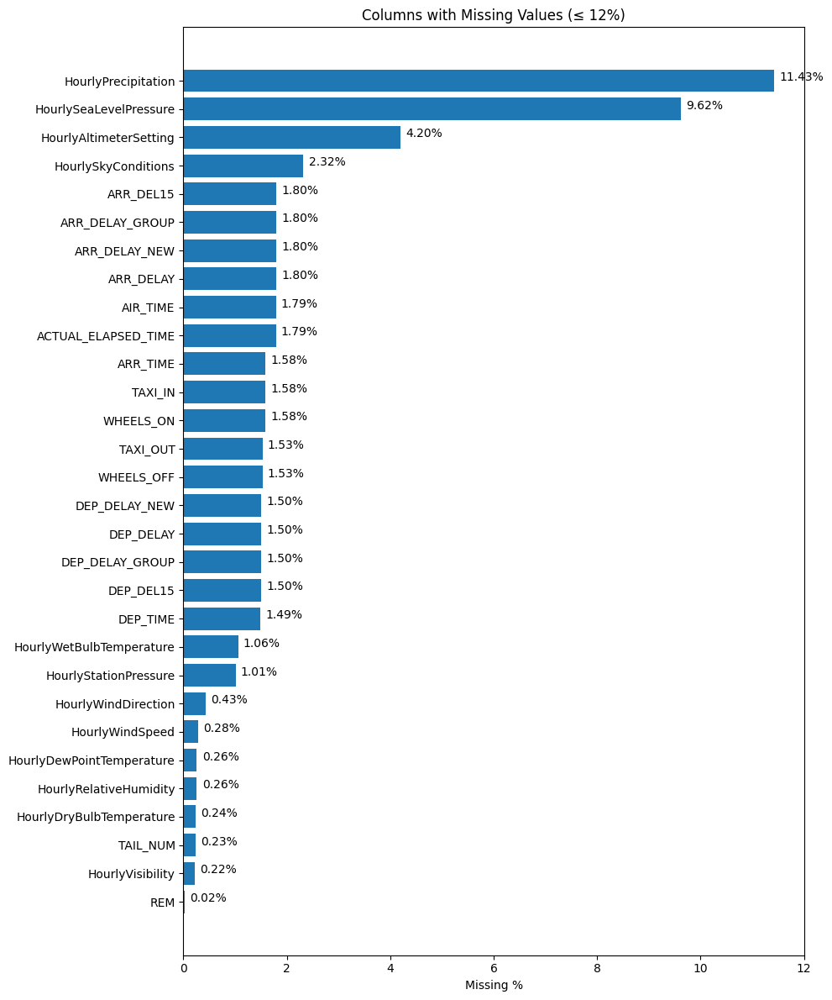

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter missing columns (<=10% and >0)
missing_cols = null_summary[(null_summary["Null_%"] > 0) & (null_summary["Null_%"] <= 12)]
missing_cols = missing_cols.sort_values(by="Null_%", ascending=True)

plt.figure(figsize=(10, 12))

plt.barh(missing_cols["Column"], missing_cols["Null_%"])
plt.xlabel("Missing %")
plt.title("Columns with Missing Values (≤ 12%)")

# Optional: show value labels
for index, value in enumerate(missing_cols["Null_%"]):
    plt.text(value + 0.1, index, f"{value:.2f}%")

plt.tight_layout()
plt.show()


In [0]:

# Count rows where DEP_TIME is NULL
null_dep_time_count = df_dedup.filter(col("DEP_TIME").isNull()).count()
print(f"Number of rows where DEP_TIME is null: {null_dep_time_count:,}")

# Display top 10 rows where DEP_TIME is NULL
null_dep_time_df = df_dedup.filter(col("DEP_TIME").isNull())
display(null_dep_time_df.limit(10))



Number of rows where DEP_TIME is null: 470,813


QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,YEAR,MONTH,origin_airport_name,origin_station_name,origin_station_id,origin_iata_code,origin_icao,origin_type,origin_region,origin_station_lat,origin_station_lon,origin_airport_lat,origin_airport_lon,origin_station_dis,dest_airport_name,dest_station_name,dest_station_id,dest_iata_code,dest_icao,dest_type,dest_region,dest_station_lat,dest_station_lon,dest_airport_lat,dest_airport_lon,dest_station_dis,sched_depart_date_time_UTC,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurati

In [0]:
# null departure for cancelled flights
null_dep_time_df.groupBy("CANCELLED").count().show()


+---------+------+
|CANCELLED| count|
+---------+------+
|      1.0|470813|
+---------+------+



In [0]:
# what is the reason for cancellation

null_dep_time_df.groupBy("CANCELLATION_CODE").count().show()

+-----------------+------+
|CANCELLATION_CODE| count|
+-----------------+------+
|                B|257034|
|                D|   407|
|                C| 88407|
|                A|124965|
+-----------------+------+



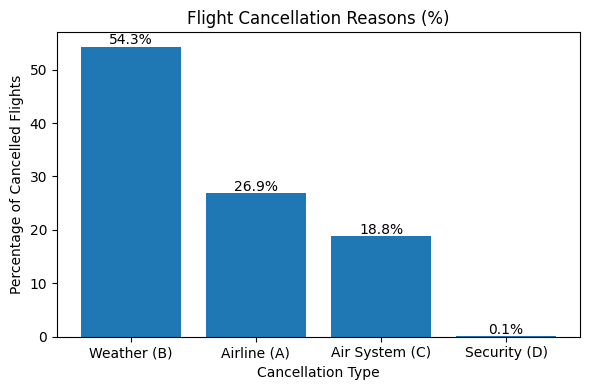

In [0]:
import matplotlib.pyplot as plt

# Get cancellation counts
cancel_df = df_dedup.groupBy("CANCELLATION_CODE").count().toPandas()

# Remove non-cancelled rows (null cancellation code)
cancel_df = cancel_df[cancel_df["CANCELLATION_CODE"].notna()]

# Map codes to readable labels
cancel_df["CANCELLATION_CODE"] = cancel_df["CANCELLATION_CODE"].replace({
    "A": "Airline (A)",
    "B": "Weather (B)",
    "C": "Air System (C)",
    "D": "Security (D)"
})

# Calculate percentage
total_cancelled = cancel_df["count"].sum()
cancel_df["percent"] = (cancel_df["count"] / total_cancelled) * 100

# Sort largest → smallest
cancel_df = cancel_df.sort_values("percent", ascending=False)

# Plot
plt.figure(figsize=(6,4))
plt.bar(cancel_df["CANCELLATION_CODE"], cancel_df["percent"])

plt.title("Flight Cancellation Reasons (%)")
plt.xlabel("Cancellation Type")
plt.ylabel("Percentage of Cancelled Flights")

# Add percentage labels
for i, v in enumerate(cancel_df["percent"]):
    plt.text(i, v + 0.5, f"{v:.1f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()


In [0]:
from pyspark.sql.functions import col

# departure is null for cancelled flights, so dropping the columns where cancelled flights == 0

df_otpw_new = df_dedup.filter(col("CANCELLED") == 0)

print(f"Remaining rows after dropping null DEP_TIME: {df_otpw_new.count():,}")


Remaining rows after dropping null DEP_TIME: 31,184,529


In [0]:
from pyspark.sql import functions as F

result = (
    df_otpw_new
        .groupBy("DEP_DELAY_GROUP")
        .agg(
            F.min("DEP_DELAY_NEW").alias("min_dep_time"),
            F.max("DEP_DELAY_NEW").alias("max_dep_time"),
            F.expr("percentile_approx(DEP_DELAY_NEW, 0.5)").alias("median_dep_time")
        )
        .orderBy("DEP_DELAY_GROUP")
)

display(result)


DEP_DELAY_GROUP,min_dep_time,max_dep_time,median_dep_time
null,null,null,null
-1,0.0,0.0,0.0
-2,0.0,0.0,0.0
0,0.0,9.0,3.0
1,15.0,29.0,21.0
10,150.0,164.0,157.0
11,165.0,179.0,172.0
12,1000.0,999.0,239.0
2,30.0,44.0,36.0
3,45.0,59.0,51.0


In [0]:
df_otpw_new.filter(F.col("DEP_DELAY_GROUP") == 12).count()


324336

In [0]:
# Deleting columns with null values > 12%

df_otpw_clean = df_dedup.select(['HourlyPrecipitation', 'HourlySeaLevelPressure', 'HourlyAltimeterSetting', 'HourlySkyConditions', 'ARR_DELAY_NEW', 'ARR_DELAY', 'ARR_DEL15', 'ARR_DELAY_GROUP', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'TAXI_IN', 'WHEELS_ON', 'ARR_TIME', 'WHEELS_OFF', 'TAXI_OUT', 'DEP_DEL15', 'DEP_DELAY_NEW', 'DEP_DELAY', 'DEP_DELAY_GROUP', 'DEP_TIME', 'HourlyWetBulbTemperature', 'HourlyStationPressure', 'HourlyWindDirection', 'HourlyWindSpeed', 'HourlyRelativeHumidity', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature', 'TAIL_NUM', 'HourlyVisibility', 'REM', 'DEST_WAC', 'DEST_STATE_FIPS', 'CRS_ARR_TIME', 'DEP_TIME_BLK', 'DIVERTED', 'CANCELLED', 'ARR_TIME_BLK', 'DEST_STATE_NM', 'QUARTER', 'OP_CARRIER', 'OP_CARRIER_AIRLINE_ID', 'OP_UNIQUE_CARRIER', 'FL_DATE', 'DAY_OF_WEEK', 'DAY_OF_MONTH', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_AIRPORT_SEQ_ID', 'ORIGIN_AIRPORT_ID', 'ORIGIN_STATE_FIPS', 'ORIGIN_STATE_ABR', 'DEST', 'DEST_CITY_MARKET_ID', 'DEST_AIRPORT_ID', 'ORIGIN_WAC', 'ORIGIN_STATE_NM', 'CRS_DEP_TIME', 'OP_CARRIER_FL_NUM', 'dest_airport_lat', 'dest_station_lon', 'dest_station_lat', 'dest_region', 'dest_type', 'dest_icao', 'ELEVATION', 'LONGITUDE', 'LATITUDE', 'DATE', 'YEAR', 'two_hours_prior_depart_UTC', 'four_hours_prior_depart_UTC', 'sched_depart_date_time_UTC', 'SOURCE', 'REPORT_TYPE', 'NAME', 'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID', 'ORIGIN', 'ORIGIN_CITY_NAME', 'STATION', 'DISTANCE_GROUP', 'DISTANCE', 'FLIGHTS', 'CRS_ELAPSED_TIME', 'MONTH', 'origin_station_lat', 'origin_region', 'origin_type', 'origin_icao', 'origin_iata_code', 'dest_airport_lon', 'origin_station_name', 'origin_airport_name', 'dest_iata_code', 'dest_station_id', 'dest_station_name', 'dest_airport_name', 'origin_station_dis', 'origin_airport_lon', 'origin_airport_lat', 'origin_station_lon', 'dest_station_dis', 'origin_station_id'])

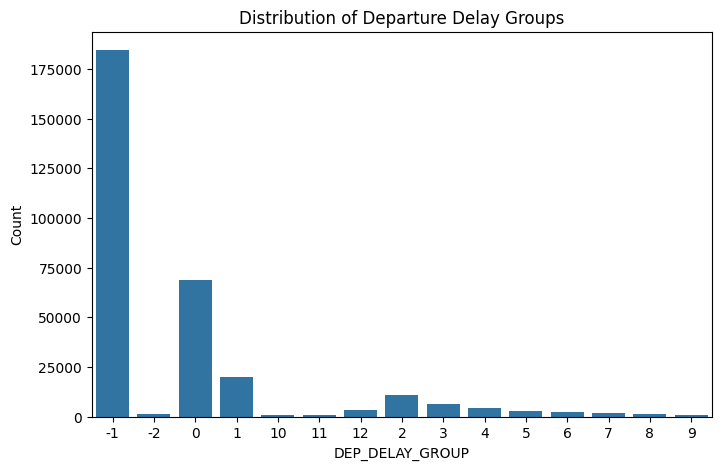

In [0]:


pdf = (df_otpw_clean
       .select("DEP_DELAY_GROUP")
       .sample(0.01, seed=42)
       .toPandas())

pdf = pdf.sort_values(by="DEP_DELAY_GROUP")

plt.figure(figsize=(8,5))
sns.countplot(x="DEP_DELAY_GROUP", data=pdf)
plt.title("Distribution of Departure Delay Groups")
plt.xlabel("DEP_DELAY_GROUP")
plt.ylabel("Count")
plt.show()



In [0]:
# Find number of remaining columns

print(f"Number of columns remaining: {len(df_otpw_clean.columns)}")

Number of columns remaining: 103


In [0]:
from pyspark.sql.functions import col

drop_cols = [
    "ARR_DELAY", "ARR_DELAY_NEW", "ARR_DELAY_GROUP", "ARR_DEL15", "DEP_DELAY", "DEP_DELAY_NEW",
    "ARR_TIME", "WHEELS_ON", "TAXI_IN", "DEP_DEL15", "TAXI_OUT",  "WHEELS_OFF"
]

df_otpw_clean = df_otpw_clean.drop(*drop_cols)

print("Remaining columns:", len(df_otpw_clean.columns))



Remaining columns: 93


In [0]:
# Deleting all other columns after review

drop_cols = [
 "OP_UNIQUE_CARRIER","OP_CARRIER_AIRLINE_ID","OP_CARRIER",
 "ORIGIN_AIRPORT_SEQ_ID","ORIGIN_CITY_MARKET_ID","ORIGIN_CITY_NAME",
 "ORIGIN_STATE_ABR","ORIGIN_STATE_FIPS","ORIGIN_STATE_NM","ORIGIN_WAC",
 "DEST_AIRPORT_SEQ_ID","DEST_CITY_MARKET_ID","DEST","DEST_CITY_NAME",
 "DEST_STATE_ABR","DEST_STATE_FIPS","DEST_STATE_NM","DEST_WAC",
 "TAXI_OUT","WHEELS_OFF","WHEELS_ON","TAXI_IN",
 "ARR_TIME","ARR_DELAY","ARR_DELAY_NEW","ARR_DEL15","ARR_DELAY_GROUP",
 "ARR_TIME_BLK","CANCELLED","CANCELLATION_CODE","DIVERTED",
 "ACTUAL_ELAPSED_TIME","AIR_TIME","FLIGHTS",
 "CARRIER_DELAY","WEATHER_DELAY","NAS_DELAY","SECURITY_DELAY",
 "LATE_AIRCRAFT_DELAY","FIRST_DEP_TIME","TOTAL_ADD_GTIME","LONGEST_ADD_GTIME",
 "origin_airport_name","origin_station_name","origin_station_id",
 "origin_icao",
 "origin_station_lat","origin_station_lon","origin_station_dis",
 "dest_airport_name","dest_station_name","dest_station_id",
 "dest_icao","dest_station_lat","dest_station_lon","dest_station_dis",
 "REPORT_TYPE","SOURCE",
 "REM"
]

df_otpw = df_otpw_clean.drop(*drop_cols)

print("Remaining columns:", len(df_otpw.columns))



Remaining columns: 51


### Checkpoint - 1 - After removing cancellation flight and null values


In [0]:
# out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_1"
# # Delete the entire directory recursively
# dbutils.fs.rm(out_path, recurse=True)
# print(f"Deleted all files and folders under: {out_path}")

Deleted all files and folders under: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_1


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_1/"

spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw_clean.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)



Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_1/


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_1/"

df_otpw = spark.read.parquet(out_path)
df_otpw.printSchema()



#display(df_otpw.limit(5))

root
 |-- HourlyPrecipitation: string (nullable = true)
 |-- HourlySeaLevelPressure: string (nullable = true)
 |-- HourlyAltimeterSetting: string (nullable = true)
 |-- HourlySkyConditions: string (nullable = true)
 |-- ARR_DELAY_NEW: string (nullable = true)
 |-- ARR_DELAY: string (nullable = true)
 |-- ARR_DEL15: string (nullable = true)
 |-- ARR_DELAY_GROUP: string (nullable = true)
 |-- ACTUAL_ELAPSED_TIME: string (nullable = true)
 |-- AIR_TIME: string (nullable = true)
 |-- TAXI_IN: string (nullable = true)
 |-- WHEELS_ON: string (nullable = true)
 |-- ARR_TIME: string (nullable = true)
 |-- WHEELS_OFF: string (nullable = true)
 |-- TAXI_OUT: string (nullable = true)
 |-- DEP_DEL15: string (nullable = true)
 |-- DEP_DELAY_NEW: string (nullable = true)
 |-- DEP_DELAY: string (nullable = true)
 |-- DEP_DELAY_GROUP: string (nullable = true)
 |-- DEP_TIME: string (nullable = true)
 |-- HourlyWetBulbTemperature: string (nullable = true)
 |-- HourlyStationPressure: string (nullable = t

In [0]:
df_otpw.count()

31672945

### **_Drop Data Leakage Columns_**


In [0]:
leakage_cols = [
    "ARR_DELAY", "ARR_DELAY_NEW", "ARR_DEL15",
    "TAXI_IN", "TAXI_OUT", "WHEELS_ON", "WHEELS_OFF",
    "ARR_TIME"
]

#"DEP_DELAY", "DEP_DELAY_NEW", "DEP_DEL15", "DEP_TIME",

# Only keep those that exist in dataset
leakage_cols = [c for c in leakage_cols if c in df_otpw.columns]

print("Leakage columns used for correlation:", leakage_cols)


Leakage columns used for correlation: ['ARR_DELAY', 'ARR_DELAY_NEW', 'ARR_DEL15', 'TAXI_IN', 'TAXI_OUT', 'WHEELS_ON', 'WHEELS_OFF', 'ARR_TIME']


In [0]:
from pyspark.sql.functions import col

drop_cols = [
    "ARR_DELAY", "ARR_DELAY_NEW", "ARR_DELAY_GROUP", "ARR_DEL15", 
    "ARR_TIME", "WHEELS_ON", "TAXI_IN", "DEP_DEL15", "TAXI_OUT",  "WHEELS_OFF"
]

df_otpw = df_otpw.drop(*drop_cols)

print("Remaining columns:", len(df_otpw.columns))



Remaining columns: 93


In [0]:
from pyspark.sql.functions import col, when, sum as _sum

total_rows = df_otpw.count()

# count NULLs per column (NULL, empty string, literal "NULL" or "*")
exprs = [
    _sum(
        when(
            col(c).isNull() | (col(c) == "") | (col(c) == "NULL") | (col(c) == "*"),
            1
        ).otherwise(0)
    ).alias(c)
    for c in df_otpw_clean.columns
]

null_summary = (
    df_otpw
      .select(exprs)
      .toPandas()
      .T
      .reset_index()
)

null_summary.columns = ["Column", "Null_Count"]
null_summary["Null_%"] = (null_summary["Null_Count"] / total_rows * 100).round(2)

# sort and view
null_summary = null_summary.sort_values("Null_%", ascending=False).reset_index(drop=True)
display(null_summary)


Column,Null_Count,Null_%
HourlyPrecipitation,3551900,11.39
HourlySeaLevelPressure,2949853,9.46
HourlyAltimeterSetting,1306938,4.19
HourlySkyConditions,741264,2.38
HourlyWetBulbTemperature,329409,1.06
HourlyStationPressure,315678,1.01
HourlyWindDirection,133855,0.43
HourlyWindSpeed,87734,0.28
HourlyDewPointTemperature,80781,0.26
HourlyRelativeHumidity,81668,0.26


In [0]:
# Deleting all other columns after review

drop_cols = [
 "OP_UNIQUE_CARRIER","OP_CARRIER",
 "ORIGIN_AIRPORT_SEQ_ID","ORIGIN_CITY_MARKET_ID","ORIGIN_CITY_NAME",
 "ORIGIN_STATE_ABR","ORIGIN_STATE_FIPS","ORIGIN_STATE_NM","ORIGIN_WAC",
 "DEST_AIRPORT_SEQ_ID","DEST_CITY_MARKET_ID","DEST","DEST_CITY_NAME",
 "DEST_STATE_ABR","DEST_STATE_FIPS","DEST_STATE_NM","DEST_WAC",
 "TAXI_OUT","WHEELS_OFF","WHEELS_ON","TAXI_IN",
 "ARR_TIME","ARR_DELAY","ARR_DELAY_NEW","ARR_DEL15","ARR_DELAY_GROUP",
 "ARR_TIME_BLK",
 "ACTUAL_ELAPSED_TIME","AIR_TIME","FLIGHTS",
 "CARRIER_DELAY","WEATHER_DELAY","NAS_DELAY","SECURITY_DELAY",
 "LATE_AIRCRAFT_DELAY","FIRST_DEP_TIME","TOTAL_ADD_GTIME","LONGEST_ADD_GTIME","YEAR",
 "origin_airport_name","origin_station_name","origin_station_id",
 "origin_icao",
 "origin_station_lat","origin_station_lon","origin_station_dis",
 "dest_airport_name","dest_station_name","dest_station_id",
 "dest_icao","dest_station_lat","dest_station_lon","dest_station_dis",
 "REPORT_TYPE","SOURCE",
 "REM"
]

df_otpw = df_otpw.drop(*drop_cols)


### Check Point - 2 - Remove Data Leakage columns and removed the columns not needed - Save Data


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_2"
# Delete the entire directory recursively
dbutils.fs.rm(out_path, recurse=True)
print(f"Deleted all files and folders under: {out_path}")

Deleted all files and folders under: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_2


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_2/"

# # create folder (optional)
# dbutils.fs.mkdirs(out_path)

# # write parquet (coalesce(1) writes one file — ok for moderate-sized DF)
# df_otpw_clean.coalesce(1).write.mode("overwrite").parquet(out_path)

# print("Wrote parquet to:", out_path)


spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)



Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_2/


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_2/"

df_otpw = spark.read.parquet(out_path)
df_otpw.printSchema()
df_otpw.count()

#display(df_otpw.limit(5))

root
 |-- HourlyPrecipitation: string (nullable = true)
 |-- HourlySeaLevelPressure: string (nullable = true)
 |-- HourlyAltimeterSetting: string (nullable = true)
 |-- HourlySkyConditions: string (nullable = true)
 |-- DEP_DELAY_NEW: string (nullable = true)
 |-- DEP_DELAY: string (nullable = true)
 |-- DEP_DELAY_GROUP: string (nullable = true)
 |-- DEP_TIME: string (nullable = true)
 |-- HourlyWetBulbTemperature: string (nullable = true)
 |-- HourlyStationPressure: string (nullable = true)
 |-- HourlyWindDirection: string (nullable = true)
 |-- HourlyWindSpeed: string (nullable = true)
 |-- HourlyRelativeHumidity: string (nullable = true)
 |-- HourlyDewPointTemperature: string (nullable = true)
 |-- HourlyDryBulbTemperature: string (nullable = true)
 |-- TAIL_NUM: string (nullable = true)
 |-- HourlyVisibility: string (nullable = true)
 |-- CRS_ARR_TIME: string (nullable = true)
 |-- DEP_TIME_BLK: string (nullable = true)
 |-- DIVERTED: string (nullable = true)
 |-- CANCELLED: string

31672945

In [0]:
import pandas as pd

# List the columns you want to check for nulls
columns_to_check = [
    'HourlyWetBulbTemperature',
    'HourlyStationPressure',
    'HourlyWindDirection',
    'HourlyWindSpeed',
    'HourlyDewPointTemperature',
    'HourlyRelativeHumidity',
    'HourlyDryBulbTemperature',
    'HourlyVisibility',
    'DEP_DELAY_GROUP',
    'DEP_DELAY_NEW',
    'DEP_DELAY'
]

# Create a new DataFrame containing only rows that have NON-NULL values
# in ALL of the columns listed above.
df_otpw = df_otpw.dropna(subset=columns_to_check)


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_1"
# Delete the entire directory recursively
dbutils.fs.rm(out_path, recurse=True)
print(f"Deleted all files and folders under: {out_path}")

Deleted all files and folders under: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_1


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_1/"
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)



Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_1/


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_1/"

df_otpw = spark.read.parquet(out_path)
df_otpw.count()


30803100

In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# ---------- SETTINGS ----------
df_in = df_otpw
ts_col = "DATE"
origin_col = "ORIGIN"
col = "HourlyAltimeterSetting"   # overwrite this column
hour_col = "ts_hour"
HARDCODE_FALLBACK = 30.12
MEDIAN_BUCKETS = 100
# -------------------------------

# 1) normalize timestamp & cast numeric
df1 = (df_in
       .withColumn("ts", F.to_timestamp(F.col(ts_col)))
       .withColumn(col, F.col(col).cast("double"))
)

# 2) origin-hour aggregation
df_hourly = (df1
    .withColumn(hour_col, F.date_trunc("hour", "ts"))
    .groupBy(origin_col, hour_col)
    .agg(F.avg(col).alias("hourly_avg"))  # you can switch to median if needed
)

# 3) per-origin median fallback
origin_median = df_hourly.groupBy(origin_col) \
    .agg(F.expr(f"percentile_approx(hourly_avg, 0.5, {MEDIAN_BUCKETS})").alias("origin_median"))

# 4) global median fallback
gm = df_hourly.selectExpr(f"percentile_approx(hourly_avg, 0.5, {MEDIAN_BUCKETS}) as gm").limit(1).collect()
global_median = gm[0]["gm"] if gm and gm[0]["gm"] is not None else HARDCODE_FALLBACK

# join medians
df_hourly = df_hourly.join(origin_median, on=origin_col, how="left")

# 5) forward-fill previous value
w = Window.partitionBy(origin_col).orderBy(hour_col).rowsBetween(Window.unboundedPreceding, 0)
df_hourly = df_hourly.withColumn("prev_val", F.last("hourly_avg", ignorenulls=True).over(w))

# 6) impute + ROUND to 2 decimals + overwrite original column name
df_hourly = df_hourly.withColumn(
    "imputed",
    F.round(
        F.coalesce(
            "hourly_avg",
            "prev_val",
            "origin_median",
            F.lit(global_median),
            F.lit(HARDCODE_FALLBACK)
        ), 2
    )
)

# 7) join back and overwrite the same column
df_otpw = (df1
    .withColumn(hour_col, F.date_trunc("hour", "ts"))
    .join(df_hourly.select(origin_col, hour_col, "imputed"), [origin_col, hour_col], "left")
    .drop(col)
    .withColumnRenamed("imputed", col)  # 
)


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_2/"

# # create folder (optional)
# dbutils.fs.mkdirs(out_path)

# # write parquet (coalesce(1) writes one file — ok for moderate-sized DF)
# df_otpw_clean.coalesce(1).write.mode("overwrite").parquet(out_path)

# print("Wrote parquet to:", out_path)


spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)



Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_2/


In [0]:
# out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_2"
# # Delete the entire directory recursively
# dbutils.fs.rm(out_path, recurse=True)
# print(f"Deleted all files and folders under: {out_path}")

Deleted all files and folders under: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_2


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_2/"

df_otpw = spark.read.parquet(out_path)
#df_otpw.printSchema()

#display(df_otpw.limit(5))
df_otpw.count()

30803100

In [0]:
from pyspark.sql import functions as F

# List the columns you want to check
cols_to_check = [
    'HourlySkyConditions',
    'HourlySeaLevelPressure',
    'HourlyPrecipitation'
]

# Calculate the sum of nulls for each specified column
# F.col(c).isNull() returns a Boolean (True if null, False otherwise)
# .cast("int") converts True to 1 and False to 0
# F.sum(...) aggregates the 1s (the null counts)
null_counts_row = df_otpw.select(
    [F.sum(F.col(c).isNull().cast("int")).alias(c) for c in cols_to_check]
).collect()[0]

print("--- Null Counts ---")
# Print the results in a readable format
for col_name in cols_to_check:
    count = null_counts_row[col_name]
    print(f"| {col_name:<25} | {count:15,} |")

# Alternatively, display the result as a DataFrame (better for notebooks)
# display(df_otpw.select([F.sum(F.col(c).isNull().cast("int")).alias(c) for c in cols_to_check]))

--- Null Counts ---
| HourlySkyConditions       |         437,411 |
| HourlySeaLevelPressure    |       2,823,296 |
| HourlyPrecipitation       |       3,219,648 |


In [0]:
import pandas as pd

# List the columns you want to check for nulls
columns_to_check = [
'HourlySkyConditions',
]

# Create a new DataFrame containing only rows that have NON-NULL values
# in ALL of the columns listed above.
df_otpw = df_otpw.dropna(subset=columns_to_check)


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/"

spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)



Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/


In [0]:
# out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/"

# df_otpw = spark.read.parquet(out_path)
#df_otpw.printSchema()

#display(df_otpw.limit(5))
df_otpw.count()

27544151

In [0]:
#Forward-fill from the previous observation at the same airport

#Backward-fill if no previous value exists

#If still null → impute "CLR:00" (clear sky)


from pyspark.sql import functions as F, Window

col = "HourlySkyConditions"
origin_col = "ORIGIN"
ts_col = "DATE"

# Window ordered by timestamp for each origin airport
w_prev = Window.partitionBy(origin_col).orderBy(ts_col).rowsBetween(Window.unboundedPreceding, 0)
w_next = Window.partitionBy(origin_col).orderBy(ts_col).rowsBetween(0, Window.unboundedFollowing)

# Forward-fill and backward-fill logic
df_sky_imputed = (
    df_otpw
    .withColumn("prev_val", F.last(col, ignorenulls=True).over(w_prev))
    .withColumn("next_val", F.first(col, ignorenulls=True).over(w_next))
    .withColumn(
        f"{col}_imputed",
        F.coalesce(
            F.col(col),           # keep original if present
            F.col("prev_val"),    # forward fill
            F.col("next_val"),    # backward fill
            F.lit("CLR:00")       # fallback if both missing
        )
    )
    .drop("prev_val", "next_val")
)

df_otpw = df_sky_imputed.withColumn("HourlySkyConditions", F.col("HourlySkyConditions_imputed")).drop("HourlySkyConditions_imputed")




In [0]:
from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType

# Assuming 'df_otpw' is your DataFrame and 'HourlySeaLevelPressure' is the column name

# --- 1. Clean and Prepare the Numeric Column ---
# Use your safe parsing logic to clean the raw column first.
df_otpw = df_otpw.withColumn(
    "slp_num_cleaned",
    F.when(F.col("HourlySeaLevelPressure").cast("double").between(26.0, 31.5),
           F.col("HourlySeaLevelPressure").cast("double"))
     .otherwise(F.lit(None).cast("double"))
)

# --- 2. Calculate the Global Median ---
# Calculate the approximate global median (29.92 is standard pressure)
global_median_row = df_otpw.selectExpr("percentile_approx(slp_num_cleaned, 0.5) AS gm").collect()
GLOBAL_MEDIAN = (
    global_median_row[0]["gm"] 
    if global_median_row and global_median_row[0]["gm"] is not None 
    else 29.92
)

# --- 3. Apply Simple Imputation ---
df_otpw = df_otpw.withColumn(
    "HourlySeaLevelPressure", # Overwrite the original column
    F.coalesce(
        F.col("slp_num_cleaned"),   # Keep the original clean value
        F.lit(GLOBAL_MEDIAN)        # Fill any remaining nulls with the global median
    ).cast(DoubleType())
)

# --- 4. Cleanup ---
df_otpw = df_otpw.drop("slp_num_cleaned")

print(f"Simple Global Median Imputation complete. Filling nulls with: {GLOBAL_MEDIAN:.2f}")

Simple Global Median Imputation complete. Filling nulls with: 30.01


In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# --------- CONFIG ---------
df_in      = df_otpw          # your working DF
origin_col = "ORIGIN"
ts_col     = "DATE"
col_raw    = "HourlySeaLevelPressure"   # in inches of mercury (inHg), typical ~27–31
COL_OUT    = col_raw                      # overwrite same column; change if you want a new name
ROUND_DEC  = 2
RANGE_LO, RANGE_HI = 26.0, 31.5          # conservative sanity bounds
HARD_FALLBACK = 29.92                     # standard pressure at sea level (inHg)
# --------------------------

# 1) Parse to numeric, kill obvious non-numeric tokens
num_regex = r"^-?\d+(\.\d+)?$"
df = (
    df_otpw
    .withColumn("ts", F.to_timestamp(F.col(ts_col)))
    .withColumn("slp_num_raw",
        F.when(F.col(col_raw).cast("string").rlike(num_regex),
               F.col(col_raw).cast("double"))
         .otherwise(F.lit(None).cast("double"))
    )
    # Treat extreme/unphysical values as missing before imputation
    .withColumn("slp_num_raw",
        F.when((F.col("slp_num_raw") >= RANGE_LO) & (F.col("slp_num_raw") <= RANGE_HI),
               F.col("slp_num_raw"))
         .otherwise(F.lit(None).cast("double"))
    )
)

# 2) Per-origin median + global median as fallbacks
origin_med = df.groupBy(origin_col).agg(
    F.expr("percentile_approx(slp_num_raw, 0.5)").alias("slp_origin_median")
)
gm_row = df.selectExpr("percentile_approx(slp_num_raw, 0.5) AS gm").limit(1).collect()
global_median = gm_row[0]["gm"] if gm_row and gm_row[0]["gm"] is not None else HARD_FALLBACK

df = df.join(origin_med, on=origin_col, how="left")

# 3) Leakage-safe forward fill within airport over time
w_ffill = Window.partitionBy(origin_col).orderBy("ts").rowsBetween(Window.unboundedPreceding, 0)
df = df.withColumn("slp_ffill", F.last("slp_num_raw", ignorenulls=True).over(w_ffill))

# 4) Impute with priority: original → ffill → origin median → global median → hard fallback
df = df.withColumn(
    "slp_imputed",
    F.coalesce(
        F.col("slp_num_raw"),
        F.col("slp_ffill"),
        F.col("slp_origin_median"),
        F.lit(global_median),
        F.lit(HARD_FALLBACK)
    ).cast("double")
)

# 5) Optional: clip to sane range and round
df = df.withColumn(
    COL_OUT,
    F.round(
        F.when(F.col("slp_imputed") < RANGE_LO, F.lit(RANGE_LO))
         .when(F.col("slp_imputed") > RANGE_HI, F.lit(RANGE_HI))
         .otherwise(F.col("slp_imputed")),
        ROUND_DEC
    )
)

# 6) Cleanup helpers
df = df.drop("slp_num_raw", "slp_ffill", "slp_origin_median", "slp_imputed")

# 7) Quick validation
# nulls = df.filter(F.col(COL_OUT).isNull()).count()
# print(f"[HourlySeaLevelPressure] remaining NULLs: {nulls}")
# df.selectExpr(
#     f"count({COL_OUT}) as n",
#     f"min({COL_OUT}) as min",
#     f"percentile_approx({COL_OUT}, 0.5) as median",
#     f"avg({COL_OUT}) as mean",
#     f"max({COL_OUT}) as max"
# ).show()

# Use df as your updated frame
df_otpw = df



In [0]:
# out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_3"
# # Delete the entire directory recursively
# dbutils.fs.rm(out_path, recurse=True)
# print(f"Deleted all files and folders under: {out_path}")

Deleted all files and folders under: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_3


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_3/"


spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)



Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3_3/


In [0]:
df_otpw.count()

30365689

In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/"  # Verify this path exists before reading.

df_otpw = spark.read.parquet(out_path)
df_otpw.printSchema()

#display(df_otpw.limit(5))

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-8516020384390532>, line 3
      1 out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/"  # Verify this path exists before reading.
----> 3 df_otpw = spark.read.parquet(out_path)
      4 df_otpw.printSchema()

File /databricks/spark/python/pyspark/instrumentation_utils.py:47, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     45 start = time.perf_counter()
     46 try:
---> 47     res = func(*args, **kwargs)
     48     logger.log_success(
     49         module_name, class_name, function_name, time.perf_counter() - start, signature
     50     )
     51     return res

File /databricks/spark/python/pyspark/sql/readwriter.py:641, in DataFrameReader.parquet(self, *paths, **options)
    630 int96RebaseMode = options.get("int96RebaseMode", None)
    631 self._set_opts(
    632     mergeSchema=mergeSchema,
   

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.sql.types import DoubleType

# Assuming the starting DataFrame is the result of your initial code (df)
# df = df_otpw.withColumn(...)

# --- 1. Define the Grouping Window ---
# Partition by the grouping keys (ORIGIN and the date part of the timestamp).
# No ordering is needed because we are calculating an aggregate (median) across the group.
# Note: You need a column that represents the DATE (day) part only.
df = df_otpw.withColumn("FL_DATE_STRING", F.date_format(F.col("ts"), "yyyy-MM-dd"))

window_group = Window.partitionBy("ORIGIN", "FL_DATE_STRING")

# --- 2. Calculate the Median Precipitation per Airport/Day ---
# PySpark lacks a direct median aggregate function for Window operations, 
# so we use approx_quantile, which is the standard, scalable approximation.

# Calculate the approximate 50th percentile (median).
# We use a large relative error (0.01) for performance, which is acceptable for imputation.
median_precip_by_group = df.groupBy("ORIGIN", "FL_DATE_STRING").agg(
    F.expr("percentile_approx(HourlyPrecipitation, array(0.5), 1000)[0]").alias("group_median_precip")
)

# --- 3. Join the Median Back to the Original DataFrame ---
df_impute = df.join(
    median_precip_by_group,
    on=["ORIGIN", "FL_DATE_STRING"],
    how="left"
)

# --- 4. Apply the Imputation ---

df_imputed_final = df_impute.withColumn(
    "HourlyPrecipitation_imputed",
    F.coalesce(
        F.col("HourlyPrecipitation_num"),      # 1. Keep original if present
        F.col("group_median_precip"),          # 2. Impute with the group median
        F.lit(0.0)                             # 3. Final Fallback (if the median itself was null, assume 0.0)
    )
).drop(
    "HourlyPrecipitation_num", "group_median_precip", "FL_DATE_STRING"
)

# 5. Final Cleanup
df_otpw = df_imputed_final.withColumn(
    "HourlyPrecipitation", 
    F.col("HourlyPrecipitation_imputed").cast(DoubleType())
).drop(
    "HourlyPrecipitation_imputed"
)

# Note: The 'HourlyPrecipitation_was_missing' flag should be retained for modeling!

print("Median imputation (grouped by ORIGIN and Day) complete.")

Median imputation (grouped by ORIGIN and Day) complete.


In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# 1) Prepare numeric precipitation column and keep a missing flag
df = df_otpw.withColumn("timestamp", F.to_timestamp("DATE")).withColumn(
    "HourlyPrecipitation_num",
    F.col("HourlyPrecipitation").cast("double"))\
.withColumn("HourlyPrecipitation_was_missing", F.col("HourlyPrecipitation_num").isNull().cast("int"))

# 2) Define windows for forward (prev non-null) and backward (next non-null) lookups
w_ffill = Window.partitionBy("ORIGIN").orderBy(F.col("timestamp")).rowsBetween(Window.unboundedPreceding, 0)
w_bfill = Window.partitionBy("ORIGIN").orderBy(F.col("timestamp")).rowsBetween(0, Window.unboundedFollowing)

# 3) Compute previous non-null and next non-null (Optimized using method chaining)
df = df.withColumn("precip_prev", F.last("HourlyPrecipitation_num", ignorenulls=True).over(w_ffill)) \
       .withColumn("precip_next", F.first("HourlyPrecipitation_num", ignorenulls=True).over(w_bfill))

# 4) SIMPLE Imputation: FFILL -> BFILL -> Fallback 0.0
df = df.withColumn(
    "HourlyPrecipitation_imputed",
    F.coalesce(
        F.col("HourlyPrecipitation_num"),        # 1. Keep original if present
        F.col("precip_prev"),                     # 2. Forward-fill (uses closest past value)
        F.col("precip_next"),                     # 3. Backward-fill (uses closest future value)
        F.lit(0.0)                                # 4. Final fallback -> no rain
    )
)

# 5 & 6) Replace and Cleanup
df = df.withColumn("HourlyPrecipitation_imputed", F.col("HourlyPrecipitation_imputed").cast("double"))
df_otpw = df.withColumn("HourlyPrecipitation", F.col("HourlyPrecipitation_imputed")).drop(
    "HourlyPrecipitation_num", "precip_prev", "precip_next", "HourlyPrecipitation_imputed", "timestamp"
)

# 7) Sanity check: ensure no nulls remain
remaining_nulls = df_otpw.filter(F.col("HourlyPrecipitation").isNull()).count()
print("Remaining NULLs after imputation:", remaining_nulls)

Remaining NULLs after imputation: 0


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_4/"


spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_otpw.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)




Parquet write completed successfully at: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_4/


In [0]:
df_otpw.count()

30365689

In [0]:
# out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_4"
# # Delete the entire directory recursively
# dbutils.fs.rm(out_path, recurse=True)
# print(f"Deleted all files and folders under: {out_path}")

Deleted all files and folders under: dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_4


In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_4/"

df_otpw = spark.read.parquet(out_path)
df_otpw.printSchema()

df_otpw.count()

display(df_otpw.limit(5))

root
 |-- ORIGIN: string (nullable = true)
 |-- ts_hour: timestamp (nullable = true)
 |-- HourlyPrecipitation: double (nullable = true)
 |-- HourlySeaLevelPressure: double (nullable = true)
 |-- HourlySkyConditions: string (nullable = true)
 |-- DEP_DELAY_NEW: string (nullable = true)
 |-- DEP_DELAY: string (nullable = true)
 |-- DEP_DELAY_GROUP: string (nullable = true)
 |-- DEP_TIME: string (nullable = true)
 |-- HourlyWetBulbTemperature: string (nullable = true)
 |-- HourlyStationPressure: string (nullable = true)
 |-- HourlyWindDirection: string (nullable = true)
 |-- HourlyWindSpeed: string (nullable = true)
 |-- HourlyRelativeHumidity: string (nullable = true)
 |-- HourlyDewPointTemperature: string (nullable = true)
 |-- HourlyDryBulbTemperature: string (nullable = true)
 |-- TAIL_NUM: string (nullable = true)
 |-- HourlyVisibility: string (nullable = true)
 |-- CRS_ARR_TIME: string (nullable = true)
 |-- DEP_TIME_BLK: string (nullable = true)
 |-- DIVERTED: string (nullable = tr

ORIGIN,ts_hour,HourlyPrecipitation,HourlySeaLevelPressure,HourlySkyConditions,DEP_DELAY_NEW,DEP_DELAY,DEP_DELAY_GROUP,DEP_TIME,HourlyWetBulbTemperature,HourlyStationPressure,HourlyWindDirection,HourlyWindSpeed,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyDryBulbTemperature,TAIL_NUM,HourlyVisibility,CRS_ARR_TIME,DEP_TIME_BLK,DIVERTED,CANCELLED,QUARTER,OP_CARRIER_AIRLINE_ID,FL_DATE,DAY_OF_WEEK,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIME,OP_CARRIER_FL_NUM,dest_airport_lat,dest_region,dest_type,ELEVATION,LONGITUDE,LATITUDE,DATE,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,NAME,STATION,DISTANCE_GROUP,DISTANCE,CRS_ELAPSED_TIME,MONTH,origin_region,origin_type,origin_iata_code,dest_airport_lon,dest_iata_code,origin_airport_lon,origin_airport_lat,ts,HourlyAltimeterSetting
CLT,2015-10-25T18:00:00Z,0.0,30.15,OVC:08 160,0.0,-2.0,-1,1813,62,29.33,000,0,81,60,66,N536UW,10.00,2019,1800-1859,0.0,0.0,4,19805,2015-10-25,7,25,11057,14679,1815,470,32.7,US-CA,large_airport,221.9,-80.9552,35.2236,2015-10-25T18:52:00,2015-10-25T20:15:00,2015-10-25T18:15:00,2015-10-25T22:15:00,"CHARLOTTE DOUGLAS AIRPORT, NC US",72314013881,9,2077.0,304.0,10,US-NC,large_airport,CLT,-117.2,SAN,-81.0,35.2,2015-10-25T18:52:00Z,30.16
KOA,2017-12-14T14:00:00Z,0.0,29.89,SCT:04 50,0.0,-4.0,-1,836,66,29.84,360,33,47,57,79,N489HA,10.00,926,0800-0859,0.0,0.0,4,19690,2017-12-14,4,14,12758,12173,840,117,21.3,US-HI,large_airport,13.1,-156.04889,19.73556,2017-12-14T14:53:00,2017-12-14T16:40:00,2017-12-14T14:40:00,2017-12-14T18:40:00,"KAILUA KONA KE AHOLE AIRPORT, HI US",91197521510,1,163.0,46.0,12,US-HI,medium_airport,KOA,-157.9,HNL,-156.0,19.7,2017-12-14T14:53:00Z,29.89
DAL,2016-01-13T08:00:00Z,0.0,30.18,FEW:02 250,0.0,0.0,0,645,42,29.65,VRB,3,73,38,46,N950WN,10.00,810,0600-0659,0.0,0.0,1,19393,2016-01-13,3,13,11259,12892,645,1004,33.9,US-CA,large_airport,134.1,-96.8555,32.8519,2016-01-13T08:53:00,2016-01-13T10:45:00,2016-01-13T08:45:00,2016-01-13T12:45:00,"DALLAS FAA AIRPORT, TX US",72258013960,5,1246.0,205.0,1,US-TX,large_airport,DAL,-118.4,LAX,-96.9,32.9,2016-01-13T08:53:00Z,30.18
BUF,2017-04-23T17:00:00Z,0.0,30.07,FEW:02 230,0.0,-3.0,-1,1737,44,29.30,210,8,23,22,60,N436WN,10.00,2040,1700-1759,0.0,0.0,2,19393,2017-04-23,7,23,10792,14635,1740,4064,26.5,US-FL,large_airport,218.2,-78.73615,42.93997,2017-04-23T17:54:00,2017-04-23T19:40:00,2017-04-23T17:40:00,2017-04-23T21:40:00,"BUFFALO NIAGARA INTERNATIONAL, NY US",72528014733,5,1144.0,180.0,4,US-NY,large_airport,BUF,-81.8,RSW,-78.7,42.9,2017-04-23T17:54:00Z,30.06
MKE,2019-12-02T08:00:00Z,0.0,30.04,FEW:02 19 BKN:07 25,7.0,7.0,0,647,27,29.28,320,13,75,22,29,N762US,10.00,930,0600-0659,0.0,0.0,4,19805,2019-12-02,1,2,13342,11298,640,2621,32.9,US-TX,large_airport,204.2,-87.9044,42.955,2019-12-02T08:52:00,2019-12-02T10:40:00,2019-12-02T08:40:00,2019-12-02T12:40:00,"MILWAUKEE MITCHELL INTERNATIONAL AIRPORT, WI US",72640014839,4,853.0,170.0,12,US-WI,large_airport,MKE,-97.0,DFW,-87.9,43.0,2019-12-02T08:52:00Z,30.01


In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# ---------- SETTINGS ----------
df_in = df_otpw
ts_col = "DATE"
origin_col = "ORIGIN"
col = "HourlyAltimeterSetting"   # overwrite this column
hour_col = "ts_hour"
HARDCODE_FALLBACK = 30.12
MEDIAN_BUCKETS = 100
# -------------------------------

# 1) normalize timestamp & cast numeric
df1 = (df_in
       .withColumn("ts", F.to_timestamp(F.col(ts_col)))
       .withColumn(col, F.col(col).cast("double"))
)

# 2) origin-hour aggregation
df_hourly = (df1
    .withColumn(hour_col, F.date_trunc("hour", "ts"))
    .groupBy(origin_col, hour_col)
    .agg(F.avg(col).alias("hourly_avg"))  # you can switch to median if needed
)

# 3) per-origin median fallback
origin_median = df_hourly.groupBy(origin_col) \
    .agg(F.expr(f"percentile_approx(hourly_avg, 0.5, {MEDIAN_BUCKETS})").alias("origin_median"))

# 4) global median fallback
gm = df_hourly.selectExpr(f"percentile_approx(hourly_avg, 0.5, {MEDIAN_BUCKETS}) as gm").limit(1).collect()
global_median = gm[0]["gm"] if gm and gm[0]["gm"] is not None else HARDCODE_FALLBACK

# join medians
df_hourly = df_hourly.join(origin_median, on=origin_col, how="left")

# 5) forward-fill previous value
w = Window.partitionBy(origin_col).orderBy(hour_col).rowsBetween(Window.unboundedPreceding, 0)
df_hourly = df_hourly.withColumn("prev_val", F.last("hourly_avg", ignorenulls=True).over(w))

# 6) impute + ROUND to 2 decimals + overwrite original column name
df_hourly = df_hourly.withColumn(
    "imputed",
    F.round(
        F.coalesce(
            "hourly_avg",
            "prev_val",
            "origin_median",
            F.lit(global_median),
            F.lit(HARDCODE_FALLBACK)
        ), 2
    )
)

# 7) join back and overwrite the same column
df_otpw = (df1
    .withColumn(hour_col, F.date_trunc("hour", "ts"))
    .join(df_hourly.select(origin_col, hour_col, "imputed"), [origin_col, hour_col], "left")
    .drop(col)
    .withColumnRenamed("imputed", col)  # 
)


In [0]:
numeric_cols = [
    "HourlyPrecipitation",
    "HourlySeaLevelPressure", 
    "HourlyAltimeterSetting", 
    "HourlyWetBulbTemperature",
    "HourlyStationPressure", 
    "HourlyWindSpeed", 
    "HourlyRelativeHumidity", 
    "HourlyDewPointTemperature", 
    "HourlyDryBulbTemperature",
]

summary_df = df_otpw.select(numeric_cols).describe()

display(summary_df)



summary,HourlyPrecipitation,HourlySeaLevelPressure,HourlyAltimeterSetting,HourlyWetBulbTemperature,HourlyStationPressure,HourlyWindSpeed,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyDryBulbTemperature
count,27632630,28234676,29877591,30856626,30868851,31096845,31104358,31105247,31111505
mean,0.0031877918215682133,30.018981012492137,30.028101541223823,55.28018477970593,29.15017246329159,9.056965266413291,60.40633429188395,47.60900406085153,63.98881633405027
stddev,0.02929897039255597,0.197580690937233,0.18752870523818432,15.75737402997397,1.3200937966975153,5.640820830737599,21.64650999503964,18.54412698706578,18.695788593485407
min,*,28.37,28.17,*,19.79,*,*,*,*
max,Ts0.09s,31.30,31.09,98,31.02,9s,99,9s,9s


In [0]:
from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType

for col_name in ["HourlyDryBulbTemperature", "HourlyWetBulbTemperature", "HourlyDewPointTemperature",
                 "HourlyRelativeHumidity", "HourlyWindSpeed", "HourlyWindDirection","HourlyPrecipitation", "HourlyStationPressure"]:
    df_otpw = df_otpw.withColumn(
        col_name,
        # Replace non-numeric artifacts with NULL
        F.when(F.col(col_name).isin("*", "9s"), F.lit(None))
        # Otherwise, keep the value and attempt the final cast
        .otherwise(F.col(col_name))
        .cast(DoubleType()) 
    )

In [0]:
numeric_cols = [
    "HourlyPrecipitation",
    "HourlySeaLevelPressure", 
    "HourlyAltimeterSetting", 
    "HourlyWetBulbTemperature",
    "HourlyStationPressure", 
    "HourlyWindSpeed", 
    "HourlyRelativeHumidity", 
    "HourlyDewPointTemperature", 
    "HourlyDryBulbTemperature",
]

summary_df = df_otpw.select(numeric_cols).describe()

display(summary_df)



summary,HourlyPrecipitation,HourlySeaLevelPressure,HourlyAltimeterSetting,HourlyWetBulbTemperature,HourlyStationPressure,HourlyWindSpeed,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyDryBulbTemperature
count,25929372,28234676,29877591,30855120,30864771,31095896,31102861,31091016,31102145
mean,0.0031877918215710934,30.018981012492123,30.028101541223812,55.28018477970593,29.150172463283212,9.056965266413291,60.40633429188395,47.60900406085153,63.98881633405027
stddev,0.02929897039255597,0.19758069093723357,0.18752870523818416,15.757374029973974,1.3200937966975153,5.640820830737606,21.646509995039644,18.544126987065784,18.695788593485407
min,0.0,28.37,28.17,-38.0,19.79,0.0,1.0,-47.0,-51.0
max,5.76,31.30,31.09,98.0,31.02,2237.0,100.0,95.0,125.0


### Imputation Analysis:


In [0]:
display(df_otpw.select("HourlyPrecipitation").summary())


summary,HourlyPrecipitation
count,27632630
mean,0.0031877918215682133
stddev,0.02929897039255597
min,*
25%,0.0
50%,0.0
75%,0.0
max,Ts0.09s


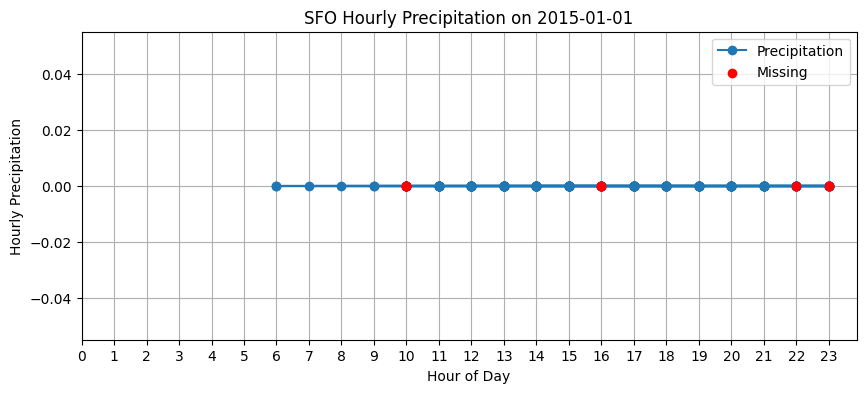

In [0]:
import pyspark.sql.functions as F
import pandas as pd
import matplotlib.pyplot as plt

# Filter for SFO + Jan 1 2015
df_plot = df_otpw.filter(
    (F.col("ORIGIN") == "SFO") &
    (F.to_date(F.col("Date")) == "2015-01-01")
).select("DATE", "HourlyPrecipitation")

# Convert timestamp to hour
df_plot = df_plot.withColumn("hour", F.hour(F.col("Date")))

# Convert to pandas for plotting
pdf = df_plot.toPandas()

# Ensure numeric precipitation
pdf["HourlyPrecipitation"] = pd.to_numeric(pdf["HourlyPrecipitation"], errors="coerce")

# Plot
plt.figure(figsize=(10,4))
plt.plot(pdf["hour"], pdf["HourlyPrecipitation"], marker="o", label="Precipitation")
plt.scatter(pdf[pdf["HourlyPrecipitation"].isna()]["hour"], 
            [0]*pdf["HourlyPrecipitation"].isna().sum(), 
            color="red", label="Missing", zorder=3)

plt.title("SFO Hourly Precipitation on 2015-01-01")
plt.xlabel("Hour of Day")
plt.ylabel("Hourly Precipitation")
plt.xticks(range(0,24))
plt.grid(True)
plt.legend()
plt.show()


In [0]:
import pyspark.sql.functions as F
import pandas as pd
import matplotlib.pyplot as plt

#filter data for DFW + Jan 1 2015
df_plot = df_otpw.filter(
    (F.col("ORIGIN") == "DFW") &
    (F.to_date(F.col("Date")) == "2015-01-01")
).select("DATE", "HourlyPrecipitation")



+-----+-------------+-------------+------------------+
|month|total_records|missing_count|       missing_pct|
+-----+-------------+-------------+------------------+
|    1|       457067|        52684| 11.52653768484708|
|    2|       408159|        45551|11.160111623166461|
|    3|       492658|        54206|11.002764595317645|
+-----+-------------+-------------+------------------+



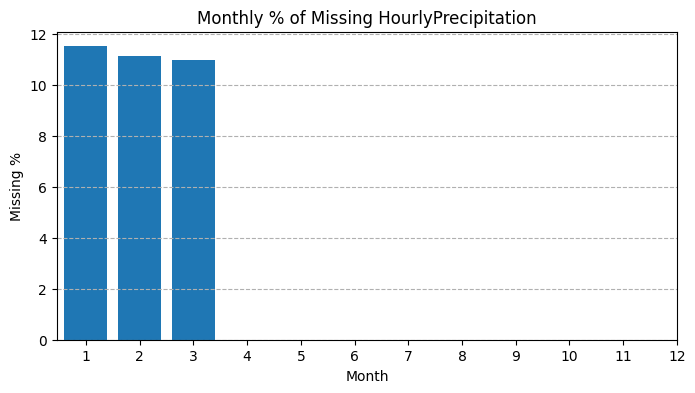

In [0]:
# Extract month from Date
df_missing = df_otpw.withColumn("month", F.month("Date"))

# Flag missing precipitation
df_missing = df_missing.withColumn(
    "is_missing", F.col("HourlyPrecipitation").isNull()
)

# Aggregate by month
df_month = df_missing.groupBy("month").agg(
    F.count("*").alias("total_records"),
    F.sum(F.col("is_missing").cast("int")).alias("missing_count")
)

df_month = df_month.withColumn(
    "missing_pct", (F.col("missing_count")/F.col("total_records")) * 100
).orderBy("month")

df_month.show()

pdf_month = df_month.toPandas()

plt.figure(figsize=(8,4))
plt.bar(pdf_month["month"], pdf_month["missing_pct"])
plt.title("Monthly % of Missing HourlyPrecipitation")
plt.xlabel("Month")
plt.ylabel("Missing %")
plt.xticks(range(1,13))
plt.grid(axis='y', linestyle='--')
plt.show()


In [0]:
display(df_otpw)

HourlyPrecipitation,HourlyAltimeterSetting,DEP_DELAY_NEW,DEP_TIME,DEP_DELAY,DEP_DELAY_GROUP,HourlySkyConditions,HourlyWetBulbTemperature,HourlyStationPressure,TAIL_NUM,HourlyWindDirection,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyWindSpeed,HourlyDryBulbTemperature,HourlyVisibility,LATITUDE,DATE,STATION,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,sched_depart_date_time,DEP_TIME_BLK,DISTANCE_GROUP,DISTANCE,CRS_ARR_TIME,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,OP_CARRIER_FL_NUM,CRS_DEP_TIME,_row_desc,NAME,ELEVATION,DEST_AIRPORT_ID,origin_airport_lon,origin_airport_lat,DAY_OF_WEEK,dest_airport_lon,FL_DATE,QUARTER,dest_airport_lat,dest_region,dest_type,LONGITUDE,CRS_ELAPSED_TIME,dest_iata_code,origin_region,origin_type,origin_iata_code,MONTH
0.01,30.22,76.0,1941,76.0,5,SCT:04 6 OVC:08 19,35,29.57,N4WTAA,030,93,34,7,36,9.00,32.8978,2015-01-01T20:38:00,72259003927,2015-01-01T22:25:00,2015-01-01T20:25:00,2015-01-02T00:25:00,2015-01-01T18:25:00,1800-1859,4,813.0,1945,1,11298,1001,1825,1,"DAL FTW WSCMO AIRPORT, TX US",170.7,15376,-97.0,32.9,4,-111.0,2015-01-01,1,32.1,US-AZ,large_airport,-97.0189,140.0,TUS,US-TX,large_airport,DFW,1
0.00,30.28,5.0,1720,5.0,0,BKN:07 70 BKN:07 130 BKN:07 200,42,29.18,N230WN,000,43,30,0,52,10.00,33.6301,2015-01-01T18:52:00,72219013874,2015-01-01T20:15:00,2015-01-01T18:15:00,2015-01-01T22:15:00,2015-01-01T17:15:00,1700-1759,3,581.0,1905,1,10397,1003,1715,1,"ATLANTA HARTSFIELD JACKSON INTERNATIONAL AIRPORT, GA US",307.8,11697,-84.4,33.6,4,-80.2,2015-01-01,1,26.1,US-FL,large_airport,-84.4418,110.0,FLL,US-GA,large_airport,ATL,1
0.00,30.14,0.0,1352,-8.0,-1,CLR:00,46,30.10,N796JB,000,64,40,0,52,10.00,33.8116,2015-01-01T18:53:00,72297023129,2015-01-01T20:00:00,2015-01-01T18:00:00,2015-01-01T22:00:00,2015-01-01T14:00:00,1400-1459,4,965.0,1643,1,12954,1006,1400,1,"LONG BEACH DAUGHERTY AIRPORT, CA US",9.4,14747,-118.1,33.8,4,-122.3,2015-01-01,1,47.4,US-WA,large_airport,-118.1463,163.0,SEA,US-CA,medium_airport,LGB,1
0.00,29.90,30.0,1235,30.0,2,FEW:02 130 SCT:04 170 BKN:07 250,24,29.65,N340LV,VRB,35,6,11,31,10.00,42.92963,2015-01-01T13:53:00,74394514710,2015-01-01T15:05:00,2015-01-01T13:05:00,2015-01-01T17:05:00,2015-01-01T12:05:00,1200-1259,2,377.0,1340,1,13296,1008,1205,1,"MANCHESTER AIRPORT, NH US",67.4,10821,-71.4,42.9,4,-76.7,2015-01-01,1,39.2,US-MD,large_airport,-71.43566,95.0,BWI,US-NH,large_airport,MHT,1
0.00,30.12,9.0,1104,9.0,0,FEW:02 20,47,29.77,N655WN,270,51,37,8,55,10.00,33.938,2015-01-01T15:53:00,72295023174,2015-01-01T16:55:00,2015-01-01T14:55:00,2015-01-01T18:55:00,2015-01-01T10:55:00,1000-1059,2,337.0,1210,1,12892,1009,1055,1,"LOS ANGELES INTERNATIONAL AIRPORT, CA US",29.6,14771,-118.4,33.9,4,-122.4,2015-01-01,1,37.6,US-CA,large_airport,-118.3888,75.0,SFO,US-CA,large_airport,LAX,1
0.00,30.07,68.0,2148,68.0,4,BKN:07 250,29,29.90,N705SW,000,50,18,0,35,10.00,39.1733,2015-01-01T21:54:00,72406093721,2015-01-01T23:40:00,2015-01-01T21:40:00,2015-01-02T01:40:00,2015-01-01T20:40:00,2000-2059,2,314.0,2155,1,10821,101,2040,1,"BALTIMORE WASHINGTON INTERNATIONAL AIRPORT, MD US",47.5,11042,-76.7,39.2,4,-81.9,2015-01-01,1,41.4,US-OH,large_airport,-76.684,75.0,CLE,US-MD,large_airport,BWI,1
0.00,30.02,0.0,1807,-3.0,-1,FEW:02 250,31,30.00,N775JB,220,43,17,22,38,10.00,40.63915,2015-01-01T19:51:00,74486094789,2015-01-01T21:10:00,2015-01-01T19:10:00,2015-01-01T23:10:00,2015-01-01T18:10:00,1800-1859,10,2465.0,2131,1,12478,1013,1810,1,"JFK INTERNATIONAL AIRPORT, NY US",3.4,12954,-73.8,40.6,4,-118.1,2015-01-01,1,33.8,US-CA,medium_airport,-73.76401,381.0,LGB,US-NY,large_airport,JFK,1
0.00,30.17,0.0,1545,-5.0,-1,BKN:07 7 BKN:07 13 OVC:08 37,69,30.06,N3AXAA,020,90,68,9,71,10.00,28.4339,2015-01-01T16:53:00,72205012815,2015-01-01T18:50:00,2015-01-01T16:50:00,2015-01-01T20:50:00,2015-01-01T15:50:00,1500-1559,4,944.0,1825,1,13204,1016,1550,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,12478,-81.3,28.4,4,-73.8,2015-01-01,1,40.6,US-NY,large_airport,-81.325,155.0,JFK,US-FL,large_airport,MCO,1
0.0

- Missing hourly precipitation values were imputed using linear interpolation (mean of previous and next valid hourly measurements). When interpolation was not possible (first/last hour of the day), missing values were imputed as 0

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# 1) Prepare numeric precipitation column and keep a missing flag
df = df_otpw.withColumn(
    "HourlyPrecipitation_num",
    F.when(F.col("HourlyPrecipitation").isin("T", "TT","Ts0.09s"), F.lit(0.01))
     .otherwise(F.col("HourlyPrecipitation").cast("double"))
)

df = df.withColumn("HourlyPrecipitation_was_missing", F.col("HourlyPrecipitation_num").isNull().cast("int"))

# 2) Define windows for forward (prev non-null) and backward (next non-null) lookups
w_ffill = Window.partitionBy("ORIGIN").orderBy(F.to_timestamp("DATE")).rowsBetween(Window.unboundedPreceding, 0)
w_bfill = Window.partitionBy("ORIGIN").orderBy(F.to_timestamp("DATE")).rowsBetween(0, Window.unboundedFollowing)

# 3) Compute previous non-null and next non-null (within same ORIGIN, ordered by time)
df = df.withColumn("precip_prev", F.last("HourlyPrecipitation_num", ignorenulls=True).over(w_ffill))
df = df.withColumn("precip_next", F.first("HourlyPrecipitation_num", ignorenulls=True).over(w_bfill))

# 4) Linear interpolation: mean(prev,next) ; fallback prev ; fallback next ; final fallback 0.0
df = df.withColumn(
    "HourlyPrecipitation_imputed",
    F.coalesce(
        F.col("HourlyPrecipitation_num"),                                # keep original if present
        ((F.col("precip_prev") + F.col("precip_next")) / 2),             # interpolation
        F.col("precip_prev"),                                            # forward-fill
        F.col("precip_next"),                                            # backward-fill
        F.lit(0.0)                                                       # final fallback -> no rain
    )
)

# 5) Replace any remaining NULLs (defensive) and overwrite original column
df = df.withColumn("HourlyPrecipitation_imputed", F.col("HourlyPrecipitation_imputed").cast("double"))
df = df.withColumn("HourlyPrecipitation", F.col("HourlyPrecipitation_imputed"))

# 6) Cleanup helper columns
df_otpw = df.drop("HourlyPrecipitation_num", "precip_prev", "precip_next", "HourlyPrecipitation_imputed")

# 7) Sanity check: ensure no nulls remain
remaining_nulls = df_otpw.filter(F.col("HourlyPrecipitation").isNull()).count()
print("Remaining NULLs after imputation:", remaining_nulls)




Remaining NULLs after imputation: 0


In [0]:
display(df.select("HourlyPrecipitation").summary())


com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$5(SequenceExecutionState.scala:132)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:132)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3$adapted(SequenceExecutionState.scala:129)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:129)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:715)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:435)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:435)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.can

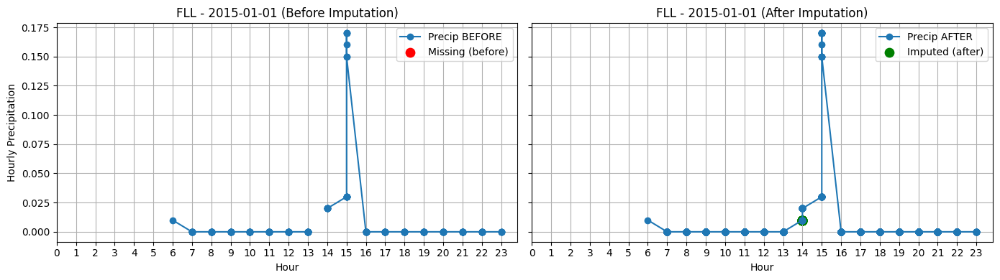

In [0]:
# BEFORE / AFTER imputation plot for precipitation (Databricks / PySpark)
import pyspark.sql.functions as F
import matplotlib.pyplot as plt
import pandas as pd

# ---------- Parameters ----------
airport = "FLL"
day = "2015-01-01"         # YYYY-MM-DD
orig_df_name = "df_otpw"   # original (before imputation) dataframe variable name
imputed_df_name = "df"     # imputed dataframe variable name
ts_col = "DATE"            # timestamp column name in both dataframes
precip_col = "HourlyPrecipitation"
# --------------------------------

# Helper to get a DataFrame variable by name (raises informative error if missing)
def get_df(varname):
    try:
        # try retrieving variable from python globals
        obj = globals()[varname]
        return obj
    except KeyError:
        raise RuntimeError(f"DataFrame named '{varname}' was not found in the notebook environment. "
                           "Make sure you have that variable defined (e.g., df_otpw for original data).")

# Load DataFrames
df_before_spark = get_df(orig_df_name)
df_after_spark  = get_df(imputed_df_name)

# Prepare and filter: ensure timestamp is parsed and extract hour
df_b = (df_before_spark
        .withColumn("ts", F.to_timestamp(F.col(ts_col)))
        .filter((F.col("ORIGIN") == airport) & (F.to_date("ts") == F.lit(day)))
        .withColumn("hour", F.hour("ts"))
        .select("ts", "hour", precip_col)
        .orderBy("ts")
)

df_a = (df_after_spark
        .withColumn("ts", F.to_timestamp(F.col(ts_col)))
        .filter((F.col("ORIGIN") == airport) & (F.to_date("ts") == F.lit(day)))
        .withColumn("hour", F.hour("ts"))
        # preserve a flag if you created one (was_missing) else compute from original nulls later
        .select("ts", "hour", precip_col, F.col("ORIGIN"))
        .orderBy("ts")
)

# Convert to pandas (should be small for a single day & airport)
pdf_b = df_b.toPandas()
pdf_a = df_a.toPandas()

# Defensive checks
if pdf_b.empty:
    print(f"WARNING: No rows found in '{orig_df_name}' for {airport} on {day}. Check the original DF or date/airport.")
if pdf_a.empty:
    print(f"WARNING: No rows found in '{imputed_df_name}' for {airport} on {day}. Check the imputed DF or date/airport.")

# Normalize column names in pandasframes
pdf_b = pdf_b.rename(columns={precip_col: "precip_before"})
pdf_a = pdf_a.rename(columns={precip_col: "precip_after"})

# Make sure ts columns are datetime
pdf_b["ts"] = pd.to_datetime(pdf_b["ts"])
pdf_a["ts"] = pd.to_datetime(pdf_a["ts"])

# Mark missing in the BEFORE snapshot
pdf_b["was_missing"] = pdf_b["precip_before"].isna()

# Mark which rows were imputed in the AFTER snapshot.
# If you created a flag in the imputed DF (e.g., 'was_missing'), prefer using it.
if "was_missing" in pdf_a.columns:
    pdf_a["was_missing_after"] = pdf_a["was_missing"].astype(bool)
else:
    # fallback: compare with before: if timestamp exists in both, check if it was null before and has value after
    #pdf_a = pdf_a.merge(pdf_b[["ts", "precip_before", "was_missing"]], on="ts", how="left")
    pdf_a = pdf_a.merge(pdf_b[["ts", "precip_before", "was_missing"]],
                    on="ts",
                    how="inner")

    pdf_a["was_missing_after"] = pdf_a["was_missing"].fillna(False).astype(bool)
    # keep precip_after column
    pdf_a = pdf_a.drop(columns=["was_missing"])

# Convert precip columns to numeric (coerce strings like "T" if present)
pdf_b["precip_before"] = pd.to_numeric(pdf_b["precip_before"], errors="coerce")
pdf_a["precip_after"]  = pd.to_numeric(pdf_a["precip_after"], errors="coerce")

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14,4), sharey=True)

# BEFORE plot
if not pdf_b.empty:
    axes[0].plot(pdf_b["hour"], pdf_b["precip_before"], marker="o", label="Precip BEFORE")
    # highlight missing points (red)
    if pdf_b["was_missing"].any():
        axes[0].scatter(
            pdf_b.loc[pdf_b["was_missing"], "hour"],
            pdf_b.loc[pdf_b["was_missing"], "precip_before"],
            color="red", s=80, label="Missing (before)"
        )
axes[0].set_title(f"{airport} - {day} (Before Imputation)")
axes[0].set_xlabel("Hour")
axes[0].set_ylabel("Hourly Precipitation")
axes[0].set_xticks(range(0,24))
axes[0].grid(True)
axes[0].legend()

# AFTER plot
if not pdf_a.empty:
    axes[1].plot(pdf_a["hour"], pdf_a["precip_after"], marker="o", label="Precip AFTER")
    # highlight imputed points (green)
    if pdf_a["was_missing_after"].any():
        axes[1].scatter(
            pdf_a.loc[pdf_a["was_missing_after"], "hour"],
            pdf_a.loc[pdf_a["was_missing_after"], "precip_after"],
            color="green", s=80, label="Imputed (after)"
        )
axes[1].set_title(f"{airport} - {day} (After Imputation)")
axes[1].set_xlabel("Hour")
axes[1].set_xticks(range(0,24))
axes[1].grid(True)
axes[1].legend()

plt.tight_layout()
plt.show()

# # Print quick comparison stats
# print("\nQuick stats:")
# print(f"Rows (before): {len(pdf_b)}  |  missing (before): {int(pdf_b['was_missing'].sum()) if 'was_missing' in pdf_b else 'N/A'}")
# print(f"Rows (after) : {len(pdf_a)}  |  imputed (after): {int(pdf_a['was_missing_after'].sum()) if 'was_missing_after' in pdf_a else 'N/A'}")

# # Show table of timestamps where imputation happened (if any)
# if pdf_a["was_missing_after"].any():
#     print("\nTimestamps that were imputed (timestamp, value_after):")
#     display(pdf_a.loc[pdf_a["was_missing_after"], ["ts","hour","precip_after"]].sort_values("ts"))
# else:
#     print("\nNo imputed timestamps detected for this airport/day in the imputed DF.")


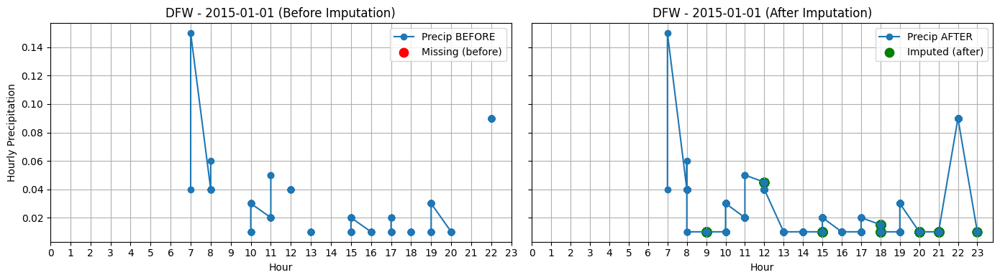

In [0]:
# BEFORE / AFTER imputation plot for precipitation (Databricks / PySpark)
import pyspark.sql.functions as F
import matplotlib.pyplot as plt
import pandas as pd

# ---------- Parameters ----------
airport = "DFW"
day = "2015-01-01"         # YYYY-MM-DD
orig_df_name = "df_otpw"   # original (before imputation) dataframe variable name
imputed_df_name = "df"     # imputed dataframe variable name
ts_col = "DATE"            # timestamp column name in both dataframes
precip_col = "HourlyPrecipitation"
# --------------------------------

# Helper to get a DataFrame variable by name (raises informative error if missing)
def get_df(varname):
    try:
        # try retrieving variable from python globals
        obj = globals()[varname]
        return obj
    except KeyError:
        raise RuntimeError(f"DataFrame named '{varname}' was not found in the notebook environment. "
                           "Make sure you have that variable defined (e.g., df_otpw for original data).")

# Load DataFrames
df_before_spark = get_df(orig_df_name)
df_after_spark  = get_df(imputed_df_name)

# Prepare and filter: ensure timestamp is parsed and extract hour
df_b = (df_before_spark
        .withColumn("ts", F.to_timestamp(F.col(ts_col)))
        .filter((F.col("ORIGIN") == airport) & (F.to_date("ts") == F.lit(day)))
        .withColumn("hour", F.hour("ts"))
        .select("ts", "hour", precip_col)
        .orderBy("ts")
)

df_a = (df_after_spark
        .withColumn("ts", F.to_timestamp(F.col(ts_col)))
        .filter((F.col("ORIGIN") == airport) & (F.to_date("ts") == F.lit(day)))
        .withColumn("hour", F.hour("ts"))
        # preserve a flag if you created one (was_missing) else compute from original nulls later
        .select("ts", "hour", precip_col, F.col("ORIGIN"))
        .orderBy("ts")
)

# Convert to pandas (should be small for a single day & airport)
pdf_b = df_b.toPandas()
pdf_a = df_a.toPandas()

# Defensive checks
if pdf_b.empty:
    print(f"WARNING: No rows found in '{orig_df_name}' for {airport} on {day}. Check the original DF or date/airport.")
if pdf_a.empty:
    print(f"WARNING: No rows found in '{imputed_df_name}' for {airport} on {day}. Check the imputed DF or date/airport.")

# Normalize column names in pandasframes
pdf_b = pdf_b.rename(columns={precip_col: "precip_before"})
pdf_a = pdf_a.rename(columns={precip_col: "precip_after"})

# Make sure ts columns are datetime
pdf_b["ts"] = pd.to_datetime(pdf_b["ts"])
pdf_a["ts"] = pd.to_datetime(pdf_a["ts"])

# Mark missing in the BEFORE snapshot
pdf_b["was_missing"] = pdf_b["precip_before"].isna()

# Mark which rows were imputed in the AFTER snapshot.
# If you created a flag in the imputed DF (e.g., 'was_missing'), prefer using it.
if "was_missing" in pdf_a.columns:
    pdf_a["was_missing_after"] = pdf_a["was_missing"].astype(bool)
else:
    # fallback: compare with before: if timestamp exists in both, check if it was null before and has value after
    #pdf_a = pdf_a.merge(pdf_b[["ts", "precip_before", "was_missing"]], on="ts", how="left")
    pdf_a = pdf_a.merge(pdf_b[["ts", "precip_before", "was_missing"]],
                    on="ts",
                    how="inner")

    pdf_a["was_missing_after"] = pdf_a["was_missing"].fillna(False).astype(bool)
    # keep precip_after column
    pdf_a = pdf_a.drop(columns=["was_missing"])

# Convert precip columns to numeric (coerce strings like "T" if present)
pdf_b["precip_before"] = pd.to_numeric(pdf_b["precip_before"], errors="coerce")
pdf_a["precip_after"]  = pd.to_numeric(pdf_a["precip_after"], errors="coerce")

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14,4), sharey=True)

# BEFORE plot
if not pdf_b.empty:
    axes[0].plot(pdf_b["hour"], pdf_b["precip_before"], marker="o", label="Precip BEFORE")
    # highlight missing points (red)
    if pdf_b["was_missing"].any():
        axes[0].scatter(
            pdf_b.loc[pdf_b["was_missing"], "hour"],
            pdf_b.loc[pdf_b["was_missing"], "precip_before"],
            color="red", s=80, label="Missing (before)"
        )
axes[0].set_title(f"{airport} - {day} (Before Imputation)")
axes[0].set_xlabel("Hour")
axes[0].set_ylabel("Hourly Precipitation")
axes[0].set_xticks(range(0,24))
axes[0].grid(True)
axes[0].legend()

# AFTER plot
if not pdf_a.empty:
    axes[1].plot(pdf_a["hour"], pdf_a["precip_after"], marker="o", label="Precip AFTER")
    # highlight imputed points (green)
    if pdf_a["was_missing_after"].any():
        axes[1].scatter(
            pdf_a.loc[pdf_a["was_missing_after"], "hour"],
            pdf_a.loc[pdf_a["was_missing_after"], "precip_after"],
            color="green", s=80, label="Imputed (after)"
        )
axes[1].set_title(f"{airport} - {day} (After Imputation)")
axes[1].set_xlabel("Hour")
axes[1].set_xticks(range(0,24))
axes[1].grid(True)
axes[1].legend()

plt.tight_layout()
plt.show()

# # Print quick comparison stats
# print("\nQuick stats:")
# print(f"Rows (before): {len(pdf_b)}  |  missing (before): {int(pdf_b['was_missing'].sum()) if 'was_missing' in pdf_b else 'N/A'}")
# print(f"Rows (after) : {len(pdf_a)}  |  imputed (after): {int(pdf_a['was_missing_after'].sum()) if 'was_missing_after' in pdf_a else 'N/A'}")

# # Show table of timestamps where imputation happened (if any)
# if pdf_a["was_missing_after"].any():
#     print("\nTimestamps that were imputed (timestamp, value_after):")
#     display(pdf_a.loc[pdf_a["was_missing_after"], ["ts","hour","precip_after"]].sort_values("ts"))
# else:
#     print("\nNo imputed timestamps detected for this airport/day in the imputed DF.")


In [0]:
from pyspark.sql import functions as F

df_rain = df_otpw.filter(F.col("HourlyAltimeterSetting").isNull())

print("Total rows where precipitation > 0:", df_rain.count())

# Show 10 sample rows

display(df_rain.orderBy("DATE").limit(30))

Total rows where precipitation > 0: 60658


HourlyPrecipitation,HourlyAltimeterSetting,DEP_DELAY_NEW,DEP_TIME,DEP_DELAY,DEP_DELAY_GROUP,HourlySkyConditions,HourlyWetBulbTemperature,HourlyStationPressure,TAIL_NUM,HourlyWindDirection,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyWindSpeed,HourlyDryBulbTemperature,HourlyVisibility,LATITUDE,DATE,STATION,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,sched_depart_date_time,DEP_TIME_BLK,DISTANCE_GROUP,DISTANCE,CRS_ARR_TIME,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,OP_CARRIER_FL_NUM,CRS_DEP_TIME,_row_desc,NAME,ELEVATION,DEST_AIRPORT_ID,origin_airport_lon,origin_airport_lat,DAY_OF_WEEK,dest_airport_lon,ORIGIN,FL_DATE,QUARTER,dest_airport_lat,dest_region,dest_type,LONGITUDE,CRS_ELAPSED_TIME,dest_iata_code,origin_region,origin_type,origin_iata_code,MONTH
null,null,0.0,158,-1.0,-1,41,34,28.88,N606NK,070,79,30,3,36,9.94,33.4277,2015-01-01T05:00:00,72278023183,2015-01-01T06:59:00,2015-01-01T04:59:00,2015-01-01T08:59:00,2015-01-01T01:59:00,0001-0559,4,868.0,502,1,14107,972,159,1,"PHOENIX AIRPORT, AZ US",337.4,11298,-112.0,33.4,4,-97.0,PHX,2015-01-01,1,32.9,US-TX,large_airport,-112.0038,123.0,DFW,US-AZ,large_airport,PHX,1
null,null,0.0,550,-5.0,-1,26,20,29.32,N334JB,220,81,16,10,21,5.59,43.11722,2015-01-01T07:00:00,72529014768,2015-01-01T08:55:00,2015-01-01T06:55:00,2015-01-01T10:55:00,2015-01-01T05:55:00,0001-0559,2,264.0,720,1,14576,185,555,1,"ROCHESTER GREATER INTERNATIONAL, NY US",164.3,12478,-77.7,43.1,4,-73.8,ROC,2015-01-01,1,40.6,US-NY,large_airport,-77.67541,85.0,JFK,US-NY,large_airport,ROC,1
null,null,19.0,619,19.0,1,null,30,29.21,N949FR,310,79,26,7,32,9.94,33.6301,2015-01-01T07:00:00,72219013874,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,3,701.0,750,1,10397,902,600,1,"ATLANTA HARTSFIELD JACKSON INTERNATIONAL AIRPORT, GA US",307.8,15356,-84.4,33.6,4,-74.8,ATL,2015-01-01,1,40.3,US-NJ,medium_airport,-84.4418,110.0,TTN,US-GA,large_airport,ATL,1
null,null,0.0,557,-3.0,-1,null,24,30.15,N203JB,230,49,12,5,29,9.94,38.8472,2015-01-01T07:00:00,72405013743,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,2,399.0,724,1,11278,1790,600,1,"WASHINGTON REAGAN NATIONAL AIRPORT, VA US",3.0,10721,-77.0,38.8,4,-71.0,DCA,2015-01-01,1,42.4,US-MA,large_airport,-77.03454,84.0,BOS,US-DC,large_airport,DCA,1
null,null,0.0,555,0.0,0,26,18,29.00,N16561,220,68,11,13,20,9.94,42.7761,2015-01-01T07:00:00,72539014836,2015-01-01T08:55:00,2015-01-01T06:55:00,2015-01-01T10:55:00,2015-01-01T05:55:00,0001-0559,1,179.0,604,1,12884,3941,555,1,"LANSING CAPITAL CITY AIRPORT, MI US",261.8,13930,-84.6,42.8,4,-87.9,LAN,2015-01-01,1,42.0,US-IL,large_airport,-84.5997,69.0,ORD,US-MI,medium_airport,LAN,1
null,null,68.0,708,68.0,4,41,22,30.12,N3JYAA,260,39,6,13,28,9.94,40.77944,2015-01-01T07:00:00,72503014732,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,5,1096.0,912,1,12953,1297,600,1,"LAGUARDIA AIRPORT, NY US",3.4,13303,-73.9,40.8,4,-80.3,LGA,2015-01-01,1,25.8,US-FL,large_airport,-73.88035,192.0,MIA,US-NY,large_airport,LGA,1
null,null,0.0,556,-4.0,-1,null,19,30.14,N766JB,230,57,9,6,22,9.94,40.6825,2015-01-01T07:00:00,72502014734,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,5,1065.0,900,1,11618,605,600,1,"NEWARK LIBERTY INTERNATIONAL AIRPORT, NJ US",2.1,11697,-74.2,40.7,4,-80.2,EWR,2015-01-01,1,26.1,US-FL,large_airport,-74.1694,180.0,FLL,US-NJ,large_airport,EWR,1
null,null,0.0,559,-1.0,-1,null,16,28.89,N910WN,220,52,5,11,20,9.94,40.4846,2015-01-01T07:00:00,72520094823,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,4,994.0,850,1,14122,2787,600,1,"PITTSBURGH ASOS, PA US",366.7,11697,-80.2,40.5,4,-80.2,PIT,2015-01-01,1,26.1,US-FL,large_airport,-80.2144,170.0,FLL,US-PA,large_airport,PIT,1
null,null,0.0,554,-6.0,-1,15,56,30.19,N598JB,030,83,54,9,59,9.94,27.96194,2015-01-01T07:00:00,72211012842,2015-01-01T09:00:00,2015-01-01T07:00:0

In [0]:
display(df_otpw.filter(
    (F.col("ORIGIN") == "MCO") &
    (F.to_date(F.col("Date")) == "2015-01-01")
))


HourlyPrecipitation,HourlyAltimeterSetting,DEP_DELAY_NEW,DEP_TIME,DEP_DELAY,DEP_DELAY_GROUP,HourlySkyConditions,HourlyWetBulbTemperature,HourlyStationPressure,TAIL_NUM,HourlyWindDirection,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyWindSpeed,HourlyDryBulbTemperature,HourlyVisibility,LATITUDE,DATE,STATION,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,sched_depart_date_time,DEP_TIME_BLK,DISTANCE_GROUP,DISTANCE,CRS_ARR_TIME,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,OP_CARRIER_FL_NUM,CRS_DEP_TIME,_row_desc,NAME,ELEVATION,DEST_AIRPORT_ID,origin_airport_lon,origin_airport_lat,DAY_OF_WEEK,dest_airport_lon,ORIGIN,FL_DATE,QUARTER,dest_airport_lat,dest_region,dest_type,LONGITUDE,CRS_ELAPSED_TIME,dest_iata_code,origin_region,origin_type,origin_iata_code,MONTH
0.00,30.17,0.0,1545,-5.0,-1,BKN:07 7 BKN:07 13 OVC:08 37,69,30.06,N3AXAA,020,90,68,9,71,10.00,28.4339,2015-01-01T16:53:00,72205012815,2015-01-01T18:50:00,2015-01-01T16:50:00,2015-01-01T20:50:00,2015-01-01T15:50:00,1500-1559,4,944.0,1825,1,13204,1016,1550,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,12478,-81.3,28.4,4,-73.8,MCO,2015-01-01,1,40.6,US-NY,large_airport,-81.325,155.0,JFK,US-FL,large_airport,MCO,1
0.00,30.20,0.0,1123,-2.0,-1,BKN:07 12 BKN:07 20 BKN:07 43,67,30.09,N39418,010,76,64,7,72,10.00,28.4339,2015-01-01T12:53:00,72205012815,2015-01-01T14:25:00,2015-01-01T12:25:00,2015-01-01T16:25:00,2015-01-01T11:25:00,1100-1159,4,937.0,1359,1,13204,1065,1125,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,11618,-81.3,28.4,4,-74.2,MCO,2015-01-01,1,40.7,US-NJ,large_airport,-81.325,154.0,EWR,US-FL,large_airport,MCO,1
null,null,20.0,1215,20.0,1,15,67,30.09,N58101,010,76,64,7,72,9.94,28.4339,2015-01-01T13:00:00,72205012815,2015-01-01T14:55:00,2015-01-01T12:55:00,2015-01-01T16:55:00,2015-01-01T11:55:00,1100-1159,4,854.0,1330,1,13204,1131,1155,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,12266,-81.3,28.4,4,-95.4,MCO,2015-01-01,1,30.0,US-TX,large_airport,-81.325,155.0,IAH,US-FL,large_airport,MCO,1
0.00,30.27,34.0,846,34.0,2,BKN:07 12 BKN:07 44,62,30.16,N63820,010,84,60,11,65,10.00,28.4339,2015-01-01T09:53:00,72205012815,2015-01-01T11:12:00,2015-01-01T09:12:00,2015-01-01T13:12:00,2015-01-01T08:12:00,0800-0859,7,1546.0,1020,1,13204,1142,812,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,11292,-81.3,28.4,4,-104.7,MCO,2015-01-01,1,39.8,US-CO,large_airport,-81.325,248.0,DEN,US-FL,large_airport,MCO,1
null,30.25,0.0,600,-5.0,-1,SCT:04 13 OVC:08 20,59,30.14,N641JB,360,90,58,9,61,10.00,28.4339,2015-01-01T07:27:00,72205012815,2015-01-01T09:05:00,2015-01-01T07:05:00,2015-01-01T11:05:00,2015-01-01T06:05:00,0600-0659,4,944.0,831,1,13204,1184,605,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,12478,-81.3,28.4,4,-73.8,MCO,2015-01-01,1,40.6,US-NY,large_airport,-81.325,146.0,JFK,US-FL,large_airport,MCO,1
null,30.27,0.0,849,-6.0,-1,SCT:04 10 BKN:07 26 OVC:08 44,63,30.16,N919WN,360,83,61,11,66,10.00,28.4339,2015-01-01T10:47:00,72205012815,2015-01-01T11:55:00,2015-01-01T09:55:00,2015-01-01T13:55:00,2015-01-01T08:55:00,0800-0859,4,882.0,1025,1,13204,1190,855,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,15016,-81.3,28.4,4,-90.4,MCO,2015-01-01,1,38.8,US-MO,large_airport,-81.325,150.0,STL,US-FL,large_airport,MCO,1
null,30.27,0.0,943,-2.0,-1,SCT:04 10 BKN:07 26 OVC:08 44,63,30.16,N7718B,360,83,61,11,66,10.00,28.4339,2015-01-01T10:47:00,72205012815,2015-01-01T12:45:00,2015-01-01T10:45:00,2015-01-01T14:45:00,2015-01-01T09:45:00,0900-0959,3,616.0,1040,1,13204,1251,945,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,10693,-81.3,28.4,4,-86.7,MCO,2015-01-01,1,36.1,US-TN,large_airport,-81.325,115.0,BNA,US-FL,large_airport,MCO,1
0.00,30.22,0.0,1929,-6.0,-1,FEW:02 2 OVC:08 5,65,30.11,N925WN,360,96,65,10,66,7.00,28.4339,2015-01-01T20:53:00,72205012815,2015-01-01T22:35:00,2015-01-01T20:35:00,2015-01-02T00:35:00,2015-01-01T19:35:00,1900-1959,5,1050.0,2210,1,13204,1517,1935,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,10529,-81.3,28.4,4,-72.7,MCO,2015-01-01,1,41.9,US-CT,large_airport,-81.325,15

In [0]:
display(df.filter(
    (F.col("ORIGIN") == "MCO") &
    (F.to_date(F.col("Date")) == "2015-01-01")
))


HourlyPrecipitation,HourlyAltimeterSetting,ACTUAL_ELAPSED_TIME,DEP_DELAY_NEW,DEP_TIME,DEP_DELAY,DEP_DELAY_GROUP,HourlySkyConditions,HourlyWetBulbTemperature,HourlyStationPressure,TAIL_NUM,HourlyWindDirection,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyWindSpeed,HourlyDryBulbTemperature,HourlyVisibility,REM,DEST_STATE_FIPS,SOURCE,LATITUDE,DATE,STATION,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,sched_depart_date_time,DEP_TIME_BLK,DIVERTED,CANCELLED,ARR_TIME_BLK,DISTANCE_GROUP,DISTANCE,CRS_ARR_TIME,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,OP_CARRIER_FL_NUM,DEST_STATE_ABR,DEST_CITY_NAME,DEST,DEST_CITY_MARKET_ID,DEST_AIRPORT_SEQ_ID,DEST_STATE_NM,ORIGIN_WAC,ORIGIN_STATE_NM,CRS_DEP_TIME,DEST_WAC,_row_desc,REPORT_TYPE,NAME,ELEVATION,FLIGHTS,DEST_AIRPORT_ID,dest_station_id,dest_station_name,dest_airport_name,origin_station_dis,origin_airport_lon,origin_airport_lat,origin_station_lon,dest_station_dis,DAY_OF_WEEK,dest_airport_lon,ORIGIN_STATE_ABR,ORIGIN_CITY_NAME,ORIGIN,ORIGIN_CITY_MARKET_ID,ORIGIN_AIRPORT_SEQ_ID,OP_CARRIER,OP_CARRIER_AIRLINE_ID,OP_UNIQUE_CARRIER,FL_DATE,ORIGIN_STATE_FIPS,QUARTER,dest_airport_lat,dest_station_lon,dest_station_lat,dest_region,dest_type,dest_icao,LONGITUDE,CRS_ELAPSED_TIME,dest_iata_code,YEAR,origin_station_lat,origin_region,origin_type,origin_icao,origin_iata_code,origin_station_id,origin_station_name,origin_airport_name,MONTH,HourlyPrecipitation_was_missing
0.0,30.24,55.0,0.0,507,-3.0,-1,BKN:07 14 OVC:08 24,59,30.13,N3CXAA,350,90,58,8,61,10.00,MET09801/01/15 06:32:02 SPECI KMCO 011132Z 35007KT 10SM BKN014 OVC024 16/14 A3024 RMK AO2 T01610144 (RK),12,7,28.4339,2015-01-01T06:32:00,72205012815,2015-01-01T08:10:00,2015-01-01T06:10:00,2015-01-01T10:10:00,2015-01-01T05:10:00,0001-0559,0.0,0.0,0600-0659,1,192.0,613,1,13204,1323,FL,"Miami, FL",MIA,32467,1330303,Florida,33,Florida,510,33,1,FM-16,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,1.0,13303,72202012839,MIAMI INTERNATIONAL AIRPORT,Miami International Airport,0.0,-81.3,28.4,-81.3,0.0,4,-80.3,FL,"Orlando, FL",MCO,31454,1320402,AA,19805,AA,2015-01-01,12,1,25.8,-80.3,25.8,US-FL,large_airport,KMIA,-81.325,63.0,MIA,2015,28.4,US-FL,large_airport,KMCO,MCO,72205012815,ORLANDO INTERNATIONAL AIRPORT,Orlando International Airport,1,1
0.0,30.24,144.0,0.0,548,-2.0,-1,OVC:08 14,59,30.13,N231JB,360,90,58,8,61,10.00,MET12201/01/15 06:53:02 METAR KMCO 011153Z 36007KT 10SM OVC014 16/14 A3024 RMK AO2 SLP238 60000 T01610144 10161 20156 53007 (RK),34,7,28.4339,2015-01-01T06:53:00,72205012815,2015-01-01T08:50:00,2015-01-01T06:50:00,2015-01-01T10:50:00,2015-01-01T05:50:00,0001-0559,0.0,0.0,0800-0859,4,937.0,819,1,13204,2228,NJ,"Newark, NJ",EWR,31703,1161802,New Jersey,33,Florida,550,21,1,FM-15,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,1.0,11618,72502014734,NEWARK LIBERTY INTERNATIONAL,Newark Liberty International Airport,0.0,-81.3,28.4,-81.3,0.0,4,-74.2,FL,"Orlando, FL",MCO,31454,1320402,B6,20409,B6,2015-01-01,12,1,40.7,-74.2,40.7,US-NJ,large_airport,KEWR,-81.325,149.0,EWR,2015,28.4,US-FL,large_airport,KMCO,MCO,72205012815,ORLANDO INTERNATIONAL AIRPORT,Orlando International Airport,1,0
0.005,null,212.0,0.0,550,-10.0,-1,15,59,30.14,N532US,360,90,58,8,61,9.94,SYN08672205 12466 83607 10161 20144 30205 40238 53007 69901 91153 333 10183 20156 555 90112=,27,4,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,0.0,0.0,0800-0859,6,1310.0,829,1,13204,1574,MN,"Minneapolis, MN",MSP,31650,1348702,Minnesota,33,Florida,600,63,1,FM-12,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,1.0,13487,72658014922,MINNEAPOLIS-ST PAUL INTERNATI,Minneapolis-St Paul International/Wold-Chamberlain Airport,0.0,-81.3,28.4,-81.3,0.0,4,-93.2,FL,"Orlando, FL",MCO,31454,1320402,DL,19790,DL,2015-01-01,12,1,44.9,-93.2,44.9,US-MN,large_airport,KMSP,-81.325,209.0,MSP,2015,28.4,US-FL,large_airport,KMCO,MCO,72205012815,ORLANDO INTERNATIONAL AIRPORT,Orlando International Airport,1,1
0.005,null,150.0,0.0,557

In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# ---------- SETTINGS ----------
df_in = df_otpw
ts_col = "DATE"
origin_col = "ORIGIN"
col = "HourlyAltimeterSetting"   # overwrite this column
hour_col = "ts_hour"
HARDCODE_FALLBACK = 30.12
MEDIAN_BUCKETS = 100
# -------------------------------

# 1) normalize timestamp & cast numeric
df1 = (df_in
       .withColumn("ts", F.to_timestamp(F.col(ts_col)))
       .withColumn(col, F.col(col).cast("double"))
)

# 2) origin-hour aggregation
df_hourly = (df1
    .withColumn(hour_col, F.date_trunc("hour", "ts"))
    .groupBy(origin_col, hour_col)
    .agg(F.avg(col).alias("hourly_avg"))  # you can switch to median if needed
)

# 3) per-origin median fallback
origin_median = df_hourly.groupBy(origin_col) \
    .agg(F.expr(f"percentile_approx(hourly_avg, 0.5, {MEDIAN_BUCKETS})").alias("origin_median"))

# 4) global median fallback
gm = df_hourly.selectExpr(f"percentile_approx(hourly_avg, 0.5, {MEDIAN_BUCKETS}) as gm").limit(1).collect()
global_median = gm[0]["gm"] if gm and gm[0]["gm"] is not None else HARDCODE_FALLBACK

# join medians
df_hourly = df_hourly.join(origin_median, on=origin_col, how="left")

# 5) forward-fill previous value
w = Window.partitionBy(origin_col).orderBy(hour_col).rowsBetween(Window.unboundedPreceding, 0)
df_hourly = df_hourly.withColumn("prev_val", F.last("hourly_avg", ignorenulls=True).over(w))

# 6) impute + ROUND to 2 decimals + overwrite original column name
df_hourly = df_hourly.withColumn(
    "imputed",
    F.round(
        F.coalesce(
            "hourly_avg",
            "prev_val",
            "origin_median",
            F.lit(global_median),
            F.lit(HARDCODE_FALLBACK)
        ), 2
    )
)

# 7) join back and overwrite the same column
df_otpw = (df1
    .withColumn(hour_col, F.date_trunc("hour", "ts"))
    .join(df_hourly.select(origin_col, hour_col, "imputed"), [origin_col, hour_col], "left")
    .drop(col)
    .withColumnRenamed("imputed", col)  # 
)


In [0]:
display(df_imputed.filter(
    (F.col("ORIGIN") == "MCO") &
    (F.to_date(F.col("Date")) == "2015-01-01")
))


ORIGIN,ts_hour,HourlyPrecipitation,DEP_DELAY_NEW,DEP_TIME,DEP_DELAY,DEP_DELAY_GROUP,HourlySkyConditions,HourlyWetBulbTemperature,HourlyStationPressure,TAIL_NUM,HourlyWindDirection,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyWindSpeed,HourlyDryBulbTemperature,HourlyVisibility,LATITUDE,DATE,STATION,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,sched_depart_date_time,DEP_TIME_BLK,DISTANCE_GROUP,DISTANCE,CRS_ARR_TIME,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,OP_CARRIER_FL_NUM,CRS_DEP_TIME,_row_desc,NAME,ELEVATION,DEST_AIRPORT_ID,origin_airport_lon,origin_airport_lat,DAY_OF_WEEK,dest_airport_lon,FL_DATE,QUARTER,dest_airport_lat,dest_region,dest_type,LONGITUDE,CRS_ELAPSED_TIME,dest_iata_code,origin_region,origin_type,origin_iata_code,MONTH,HourlyPrecipitation_was_missing,ts,HourlyAltimeterSetting
MCO,2015-01-01T06:00:00Z,0.0,0.0,507,-3.0,-1,BKN:07 14 OVC:08 24,59,30.13,N3CXAA,350,90,58,8,61,10.00,28.4339,2015-01-01T06:32:00,72205012815,2015-01-01T08:10:00,2015-01-01T06:10:00,2015-01-01T10:10:00,2015-01-01T05:10:00,0001-0559,1,192.0,613,1,13204,1323,510,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,13303,-81.3,28.4,4,-80.3,2015-01-01,1,25.8,US-FL,large_airport,-81.325,63.0,MIA,US-FL,large_airport,MCO,1,1,2015-01-01T06:32:00Z,30.24
MCO,2015-01-01T06:00:00Z,0.0,0.0,548,-2.0,-1,OVC:08 14,59,30.13,N231JB,360,90,58,8,61,10.00,28.4339,2015-01-01T06:53:00,72205012815,2015-01-01T08:50:00,2015-01-01T06:50:00,2015-01-01T10:50:00,2015-01-01T05:50:00,0001-0559,4,937.0,819,1,13204,2228,550,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,11618,-81.3,28.4,4,-74.2,2015-01-01,1,40.7,US-NJ,large_airport,-81.325,149.0,EWR,US-FL,large_airport,MCO,1,0,2015-01-01T06:53:00Z,30.24
MCO,2015-01-01T07:00:00Z,0.005,0.0,550,-10.0,-1,15,59,30.14,N532US,360,90,58,8,61,9.94,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,6,1310.0,829,1,13204,1574,600,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,13487,-81.3,28.4,4,-93.2,2015-01-01,1,44.9,US-MN,large_airport,-81.325,209.0,MSP,US-FL,large_airport,MCO,1,1,2015-01-01T07:00:00Z,30.25
MCO,2015-01-01T07:00:00Z,0.005,0.0,557,-3.0,-1,15,59,30.14,N523JB,360,90,58,8,61,9.94,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,4,950.0,825,1,13204,198,600,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,12953,-81.3,28.4,4,-73.9,2015-01-01,1,40.8,US-NY,large_airport,-81.325,145.0,LGA,US-FL,large_airport,MCO,1,1,2015-01-01T07:00:00Z,30.25
MCO,2015-01-01T07:00:00Z,0.005,0.0,555,-5.0,-1,15,59,30.14,N24224,360,90,58,8,61,9.94,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,4,937.0,834,1,13204,1163,600,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,11618,-81.3,28.4,4,-74.2,2015-01-01,1,40.7,US-NJ,large_airport,-81.325,154.0,EWR,US-FL,large_airport,MCO,1,1,2015-01-01T07:00:00Z,30.25
MCO,2015-01-01T07:00:00Z,0.005,2.0,557,2.0,0,15,59,30.14,N68452,360,90,58,8,61,9.94,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T08:55:00,2015-01-01T06:55:00,2015-01-01T10:55:00,2015-01-01T05:55:00,0001-0559,9,2218.0,836,1,13204,1222,555,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,12892,-81.3,28.4,4,-118.4,2015-01-01,1,33.9,US-CA,large_airport,-81.325,341.0,LAX,US-FL,large_airport,MCO,1,1,2015-01-01T07:00:00Z,30.25
MCO,2015-01-01T07:00:00Z,0.005,0.0,557,-3.0,-1,15,59,30.14,N536UW,360,90,58,8,61,9.94,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T09:00:00,2015-01-01T07:00:00,2015-01-01T11:00:00,2015-01-01T06:00:00,0600-0659,8,1849.0,841,1,13204,459,600,1,"ORLANDO INTERNATIONAL AIRPORT, FL US",27.4,14107,-81.3,28.4,4,-112.0,2015-01-01,1,33.4,US-AZ,large_airport,-81.325,281.0,PHX,US-FL,large_airport,MCO,1,1,2015-01-01T07:00:00Z,30.25
MCO,2015-01-01T07:00:00Z,0.005,0.0,554,-6.0,-1,15,59,30.14,N358NW,360,90,58,8,61,9.94,28.4339,2015-01-01T07:00:00,72205012815,2015-01-01T09:00:00,2015

In [0]:
# HourlyPrecipitation - Done
# HourlyAltimeterSetting - Done
# HourlySkyConditions
# HourlyWetBulbTemperature - Done
# HourlyStationPressure - 
# HourlyWindDirection
# HourlyRelativeHumidity
# HourlyWindSpeed
# HourlyDryBulbTemperature - Done
# HourlyDewPointTemperature - Done
# HourlyVisibility



In [0]:

from pyspark.sql import functions as F
from pyspark.sql.window import Window

def impute_numeric(df, colname, ts_col="DATE", group_col="ORIGIN", hard_fallback=None):
    # parse ts into a temp column; don't overwrite the original
    df = df.withColumn("_ts_", F.to_timestamp(F.col(ts_col)))

    # scrub to numeric double
    df = (df
          .withColumn(colname, F.regexp_replace(F.col(colname).cast("string"), r"[^-0-9.]", ""))
          .withColumn(colname, F.col(colname).cast("do
                                                   uble")))

    # per-group & global medians (null-safe)
    origin_med = df.groupBy(group_col).agg(
        F.expr(f"percentile_approx({colname}, 0.5, 1000)").alias("_origin_med_")
    )
    gm = (df.selectExpr(f"percentile_approx({colname}, 0.5, 1000) as gm")
            .limit(1).collect())
    global_med = (gm[0]["gm"] if gm and gm[0]["gm"] is not None
                  else (hard_fallback if hard_fallback is not None else 0.0))

    df = df.join(origin_med, on=group_col, how="left")

    # forward fill within group
    w = Window.partitionBy(group_col).orderBy("_ts_").rowsBetween(Window.unboundedPreceding, 0)
    df = df.withColumn("_prev_", F.last(F.col(colname), ignorenulls=True).over(w))

    # coalesce: value -> prev -> group median -> global fallback
    df = df.withColumn(
        colname,
        F.coalesce(F.col(colname), F.col("_prev_"), F.col("_origin_med_"), F.lit(float(global_med)))
         .cast("double")
    ).drop("_prev_", "_origin_med_", "_ts_")

    return df

# ---- CHAIN IMPUTATIONS ON THE SAME DF ----
df = df_otpw # start once

df = impute_numeric(df, "HourlyDewPointTemperature",  hard_fallback=32.0)
df = impute_numeric(df, "HourlyDryBulbTemperature",   hard_fallback=50.0)
df = impute_numeric(df, "HourlyWetBulbTemperature",   hard_fallback=42.0)

# quick validation
for c in ["HourlyDewPointTemperature", "HourlyDryBulbTemperature", "HourlyWetBulbTemperature"]:
    print(c, df.filter(F.col(c).isNull()).count())




HourlyDewPointTemperature 0
HourlyDryBulbTemperature 0
HourlyWetBulbTemperature 0


In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# ---------- PARAMETERS ----------
df_in = df                      # your DataFrame
ts_col = "DATE"                 # timestamp col - must be parseable by to_timestamp
origin_col = "ORIGIN"
col = "HourlyStationPressure"
# sensible physical range in inHg (adjust if units differ)
RANGE_LO, RANGE_HI = 22.0, 32.0
HARDCODE_FALLBACK = 29.62       # typical sea-level-ish median (use your observed median if you want)
# ---------------------------------

# 0) setup: ensure timestamp and trim
df_work = (
    df_in
    .withColumn("ts", F.to_timestamp(F.col(ts_col)))
)

# 1) clean: keep only numeric tokens, else NULL
num_regex = r"^[+-]?\d+(\.\d+)?$"
df_work = df_work.withColumn(
    col,
    F.when(F.trim(F.col(col)).rlike(num_regex), F.col(col).cast("double"))
     .otherwise(None)
)

# 2) clip to physical range (treat out-of-range as null so it gets imputed)
df_work = df_work.withColumn(col, F.when((F.col(col) >= RANGE_LO) & (F.col(col) <= RANGE_HI), F.col(col)).otherwise(None))

# 3) compute per-origin median and global median (percentile_approx w/o third arg)
origin_meds = df_work.groupBy(origin_col).agg(F.expr(f"percentile_approx({col}, 0.5)").alias(f"{col}_origin_med"))

gm_row = df_work.selectExpr(f"percentile_approx({col}, 0.5) as gm").limit(1).collect()
global_med = gm_row[0]["gm"] if gm_row and gm_row[0]["gm"] is not None else HARDCODE_FALLBACK

# 4) join origin median
df_work = df_work.join(origin_meds, on=origin_col, how="left")

# 5) forward-fill window per origin (order by ts)
w_ffill = Window.partitionBy(origin_col).orderBy("ts").rowsBetween(Window.unboundedPreceding, 0)
df_work = df_work.withColumn("ffill_" + col, F.last(col, ignorenulls=True).over(w_ffill))

# 6) coalesce: original -> forward-fill -> origin median -> global median -> hard fallback
df_work = df_work.withColumn(
    col,
    F.coalesce(
        F.col(col),
        F.col("ffill_" + col),
        F.col(f"{col}_origin_med"),
        F.lit(global_med),
        F.lit(HARDCODE_FALLBACK)
    ).cast("double")
).drop("ffill_" + col)

# 7) round to 2 decimals and keep same column name (overwrite)
df_work = df_work.withColumn(col, F.round(F.col(col), 2))

# 8) drop helper origin median col
if f"{col}_origin_med" in df_work.columns:
    df_work = df_work.drop(f"{col}_origin_med")

# # 9) validation: null count & summary
# null_count = df_work.filter(F.col(col).isNull()).count()
# print(f"Nulls remaining in {col} after imputation: {null_count:,}")

# print("\nSummary after imputation:")
# df_work.select(col).summary("min","25%","50%","75%","max","mean","stddev").show()

# assign out
df_imputed = df_work




In [0]:
df_imputed.select("HourlyWindDirection").summary("min","25%","50%","75%","max","mean").show()


+-------+-------------------+
|summary|HourlyWindDirection|
+-------+-------------------+
|    min|                0.0|
|    25%|               90.0|
|    50%|              180.0|
|    75%|              270.0|
|    max|              360.0|
|   mean| 177.39935145045328|
+-------+-------------------+



In [0]:
#HourlyRelativeHumidity

df_imputed.select("HourlyRelativeHumidity").summary("min","25%","50%","75%","max","mean").show()


+-------+----------------------+
|summary|HourlyRelativeHumidity|
+-------+----------------------+
|    min|                     *|
|    25%|                  44.0|
|    50%|                  61.0|
|    75%|                  78.0|
|    max|                    99|
|   mean|     60.16982089891925|
+-------+----------------------+



In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# -------- PARAMETERS ----------
df_in = df_imputed                    # your input Spark DataFrame
ts_col = "DATE"
origin_col = "ORIGIN"
col = "HourlyRelativeHumidity"
NUM_DECIMALS = 1                 # round to 1 decimal (use 0 for integers)
HARDCODE_FALLBACK = 60.0         # sensible fallback if medians missing (use observed median if you prefer)
RANGE_LO, RANGE_HI = 0.0, 100.0  # allowed RH range (percent)
# -------------------------------

# 0) ensure timestamp column parsed
df_work = df_in.withColumn("ts", F.to_timestamp(F.col(ts_col)))



# 2) clip to allowed RH range, otherwise set to NULL (so it will get imputed)
df_work = df_work.withColumn(col, F.when((F.col(col) >= RANGE_LO) & (F.col(col) <= RANGE_HI), F.col(col)).otherwise(None))

# 3) compute per-origin median (percentile_approx) and global median
origin_meds = df_work.groupBy(origin_col).agg(F.expr(f"percentile_approx({col}, 0.5)").alias(f"{col}_origin_med"))
gm_row = df_work.selectExpr(f"percentile_approx({col}, 0.5) as gm").limit(1).collect()
global_med = gm_row[0]["gm"] if gm_row and gm_row[0]["gm"] is not None else HARDCODE_FALLBACK

# 4) join origin median
df_work = df_work.join(origin_meds, on=origin_col, how="left")

# 5) forward-fill window per origin (order by timestamp)
w_ffill = Window.partitionBy(origin_col).orderBy("ts").rowsBetween(Window.unboundedPreceding, 0)
df_work = df_work.withColumn("ffill_" + col, F.last(col, ignorenulls=True).over(w_ffill))

# 6) coalesce: original -> ffill -> origin median -> global median -> hard fallback
df_work = df_work.withColumn(
    col,
    F.coalesce(
        F.col(col),
        F.col("ffill_" + col),
        F.col(f"{col}_origin_med"),
        F.lit(global_med),
        F.lit(HARDCODE_FALLBACK)
    ).cast("double")
)

# 7) round and overwrite same column
df_work = df_work.withColumn(col, F.round(F.col(col), NUM_DECIMALS))

# 8) cleanup helper cols
df_work = df_work.drop("ffill_" + col)
if f"{col}_origin_med" in df_work.columns:
    df_work = df_work.drop(f"{col}_origin_med")

# # 9) validation: null count & summary
# null_count = df_work.filter(F.col(col).isNull()).count()
# print(f"Remaining nulls in {col} after imputation: {null_count:,}")

# print("\nSummary after imputation:")
# df_work.select(col).summary("min","25%","50%","75%","max","mean","stddev").show()

# final DF
df_imputed = df_work


In [0]:
#HourlyWindSpeed
df_imputed.select("HourlyWindSpeed").summary("min","25%","50%","75%","max","mean").show()


+-------+-----------------+
|summary|  HourlyWindSpeed|
+-------+-----------------+
|    min|                0|
|    25%|              5.0|
|    50%|              8.0|
|    75%|             13.0|
|    max|               9s|
|   mean|8.885570117461553|
+-------+-----------------+



In [0]:
#HourlyVisibility
df_imputed.select("HourlyVisibility").summary("min","25%","50%","75%","max","mean").show()


+-------+-----------------+
|summary| HourlyVisibility|
+-------+-----------------+
|    min|                *|
|    25%|             10.0|
|    50%|             10.0|
|    75%|             10.0|
|    max|             9.94|
|   mean|9.063972570620441|
+-------+-----------------+



In [0]:
# |-- HourlySkyConditions: string (nullable = true)

df_otpw.select("HourlySkyConditions").distinct().show(100, truncate=False)
#sky_primary sky_base_ft

# CLR	Clear - No Impact
# FEW	Few clouds - Low Impact
# SCT	Scattered - Moderate Impact
# BKN	Broken - Bad Impact
# OVC	Overcast - Worst Impact

#<SKY_CODE>:<LAYER_NUM> <HEIGHT>  <SKY_CODE>:<LAYER_NUM> <HEIGHT> ...

# derived features from this column:
# - sky_primary
# - sky_base_ft




+--------------------------------+
|HourlySkyConditions             |
+--------------------------------+
|CLR:00                          |
|SCT:04 110 SCT:04 180           |
|SCT:04 170 BKN:07 200 BKN:07 250|
|FEW:02 23 BKN:07 100 OVC:08 150 |
|BKN:07 37 OVC:08 50             |
|FEW:02 27 FEW:02 80 BKN:07 230  |
|FEW:02 30 BKN:07 39 OVC:08 65   |
|SCT:04 42 BKN:07 65             |
|FEW:02 23 FEW:02 38             |
|BKN:07 100 BKN:07 170           |
|BKN:07 38 BKN:07 44             |
|BKN:07 13 OVC:08 15             |
|FEW:02 120 BKN:07 200 OVC:08 250|
|BKN:07 13 BKN:07 19 OVC:08 25   |
|FEW:02 21 SCT:04 29 BKN:07 50   |
|SCT:04 44 BKN:07 150            |
|SCT:04 30 OVC:08 50             |
|SCT:04 4 BKN:07 10 OVC:08 49    |
|FEW:02 3 BKN:07 34 OVC:08 48    |
|FEW:02 45 SCT:04 60 SCT:04 250  |
|SCT:04 3 BKN:07 250             |
|FEW:02 5 BKN:07 33 OVC:08 45    |
|BKN:07 90 OVC:08 120            |
|BKN:07 140 OVC:08 210           |
|BKN:07 17                       |
|BKN:07 150         

In [0]:
from pyspark.sql import functions as F, Window

# Replace "*" with NULL

# Convert column to double

# Impute missing values using median per ORIGIN (airport) with global median fallback

# No interpolation needed (visibility does not change smoothly like temperature)

# Optionally cap values > 10 to 10 (METAR standard), but your data already respects it

col = "HourlyVisibility"
origin_col = "ORIGIN"

# 1) Replace '*' and cast to double
df = df_imputed.withColumn(col, F.when(F.col(col) == "*", None).otherwise(F.col(col).cast("double")))

# 2) Compute median per airport
origin_median = df.groupBy(origin_col).agg(
    F.expr(f"percentile_approx({col}, 0.5)").alias("origin_median")
)

# 3) Global median fallback
global_median = df.selectExpr(f"percentile_approx({col}, 0.5) as gm").first()["gm"]

# 4) Join medians back
df = df.join(origin_median, on=origin_col, how="left")

# 5) Impute → airport median → global median (no interpolation)
df_imputed = df.withColumn(
    col,
    F.coalesce(F.col(col), F.col("origin_median"), F.lit(global_median))
).drop("origin_median")

# 6) Validate no nulls remain
df_imputed.filter(F.col(col).isNull()).count()





0

In [0]:
#Forward-fill from the previous observation at the same airport

#Backward-fill if no previous value exists

#If still null → impute "CLR:00" (clear sky)


from pyspark.sql import functions as F, Window

col = "HourlySkyConditions"
origin_col = "ORIGIN"
ts_col = "DATE"

# Window ordered by timestamp for each origin airport
w_prev = Window.partitionBy(origin_col).orderBy(ts_col).rowsBetween(Window.unboundedPreceding, 0)
w_next = Window.partitionBy(origin_col).orderBy(ts_col).rowsBetween(0, Window.unboundedFollowing)

# Forward-fill and backward-fill logic
df_sky_imputed = (
    df_imputed
    .withColumn("prev_val", F.last(col, ignorenulls=True).over(w_prev))
    .withColumn("next_val", F.first(col, ignorenulls=True).over(w_next))
    .withColumn(
        f"{col}_imputed",
        F.coalesce(
            F.col(col),           # keep original if present
            F.col("prev_val"),    # forward fill
            F.col("next_val"),    # backward fill
            F.lit("CLR:00")       # fallback if both missing
        )
    )
    .drop("prev_val", "next_val")
)

df_imputed = df_sky_imputed.withColumn("HourlySkyConditions", F.col("HourlySkyConditions_imputed")).drop("HourlySkyConditions_imputed")




In [0]:
from pyspark.sql import functions as F, Window

origin_col = "ORIGIN"
ts_col     = "DATE"
col_raw    = "HourlyWindDirection"

dfw = (df_imputed
       .withColumn("ts", F.to_timestamp(F.col(ts_col)))
       .withColumn(col_raw, F.trim(F.col(col_raw).cast("string")))
       # map VRB to null, keep numeric strings like "000","45","270"
       .withColumn("wind_deg_raw",
           F.when(F.col(col_raw) == "VRB", None)
            .when(F.col(col_raw).rlike(r"^\d{1,3}$"), F.col(col_raw).cast("int"))
            .otherwise(None)
       )
       # keep only 0..360
       .withColumn("wind_deg_raw",
           F.when((F.col("wind_deg_raw") >= 0) & (F.col("wind_deg_raw") <= 360),
                  F.col("wind_deg_raw")).otherwise(None)
       )
)

# per-origin median (as fallback) and forward-fill (leakage-safe)
origin_med = dfw.groupBy(origin_col).agg(
    F.expr("percentile_approx(wind_deg_raw, 0.5)").alias("wind_deg_origin_med")
)
gm = dfw.selectExpr("percentile_approx(wind_deg_raw, 0.5) as gm").first()
global_med = gm.gm if gm and gm.gm is not None else 180.0

w_ff = Window.partitionBy(origin_col).orderBy("ts") \
             .rowsBetween(Window.unboundedPreceding, 0)

dfw = (dfw.join(origin_med, on=origin_col, how="left")
          .withColumn("wind_ffill", F.last("wind_deg_raw", ignorenulls=True).over(w_ff))
          .withColumn("wind_deg_imputed",
              F.coalesce("wind_deg_raw", "wind_ffill", "wind_deg_origin_med", F.lit(float(global_med))).cast("double")
          )
          .drop("wind_ffill","wind_deg_origin_med")
)

# circular encoding
dfw = (dfw.withColumn("wind_rad", F.radians("wind_deg_imputed"))
          .withColumn("wind_dir_sin", F.sin("wind_rad"))
          .withColumn("wind_dir_cos", F.cos("wind_rad"))
          .drop("wind_rad")
)

# (optional) replace original, and quick sanity check
df_imputed = (dfw
            .drop(col_raw)  # drop raw text
            .withColumnRenamed("wind_deg_imputed", "HourlyWindDirection"))

# print("Nulls (deg/sin/cos):",
#       df_final.filter(F.col("HourlyWindDirection_deg").isNull()).count(),
#       df_final.filter(F.col("wind_dir_sin").isNull()).count(),
#       df_final.filter(F.col("wind_dir_cos").isNull()).count())

# quick numeric summary
#df_final.select("HourlyWindDirection_deg").summary("min","25%","50%","75%","max","mean","stddev").show()


In [0]:



from pyspark.sql import functions as F
from pyspark.sql import Window

# ---------- PARAMETERS ----------
df_in = df_imputed                     # your input Spark DataFrame (change if needed)
ts_col = "DATE"
origin_col = "ORIGIN"
col_raw = "HourlyWindSpeed"
NUM_DECIMALS = 1               # final rounding
HARDCODE_FALLBACK = 8.0        # sensible fallback (dataset median ~8.9)
# ---------------------------------

# 0) ensure timestamp parsed
df_work = df_in.withColumn("ts", F.to_timestamp(F.col(ts_col)))

# 1) normalize raw column to string and trim
df_work = df_work.withColumn(col_raw, F.trim(F.col(col_raw).cast("string")))

# 2) extract first numeric token (integer or decimal) — handles '9s', '0.01', 'T', etc.
# This extracts a leading number anywhere in the string; returns '' if none
df_work = df_work.withColumn(
    "_w_num",
    F.regexp_extract(F.col(col_raw), r'([+-]?\d+(\.\d+)?)', 1)
)

# 3) map empty string -> NULL and cast to double
df_work = df_work.withColumn(
    "_w_num",
    F.when(F.col("_w_num") == "", None).otherwise(F.col("_w_num").cast("double"))
)

# 4) treat obviously invalid values (<0) as NULL (wind speed can't be negative)
df_work = df_work.withColumn("_w_num", F.when(F.col("_w_num") >= 0, F.col("_w_num")).otherwise(None))

# 5) compute per-origin median and global median (percentile_approx)
origin_med = df_work.groupBy(origin_col).agg(F.expr(f"percentile_approx(_w_num, 0.5)").alias("origin_med_wind"))
gm_row = df_work.selectExpr("percentile_approx(_w_num, 0.5) as global_med").limit(1).collect()
global_med = gm_row[0]["global_med"] if gm_row and gm_row[0]["global_med"] is not None else HARDCODE_FALLBACK

# join origin median
df_work = df_work.join(origin_med, on=origin_col, how="left")

# 6) forward-fill per origin ordered by timestamp (leakage-safe)
w_ffill = Window.partitionBy(origin_col).orderBy("ts").rowsBetween(Window.unboundedPreceding, 0)
df_work = df_work.withColumn("wind_ffill", F.last("_w_num", ignorenulls=True).over(w_ffill))

# 7) coalesce to impute: original numeric -> ffill -> origin median -> global median -> hard fallback
df_work = df_work.withColumn(
    "HourlyWindSpeed_imputed",
    F.coalesce(
        F.col("_w_num"),
        F.col("wind_ffill"),
        F.col("origin_med_wind"),
        F.lit(global_med),
        F.lit(HARDCODE_FALLBACK)
    ).cast("double")
)

# 8) round and overwrite the original column name
df_work = df_work.withColumn(col_raw, F.round(F.col("HourlyWindSpeed_imputed"), NUM_DECIMALS))

# 9) cleanup helper columns
df_work = df_work.drop("_w_num", "wind_ffill", "origin_med_wind", "HourlyWindSpeed_imputed")

# # 10) validation: null count and before/after summary (after imputation)
# null_count = df_work.filter(F.col(col_raw).isNull()).count()
# print(f"Remaining nulls in {col_raw} after imputation: {null_count:,}")

# print("\nSummary after imputation:")
# df_work.select(col_raw).summary("min","25%","50%","75%","max","mean","stddev").show()

# final df
df_imputed = df_work


In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

# --------- CONFIG ---------
df_in      = df_imputed            # your working DF
origin_col = "ORIGIN"
ts_col     = "DATE"
col_raw    = "HourlySeaLevelPressure"   # in inches of mercury (inHg), typical ~27–31
COL_OUT    = col_raw                      # overwrite same column; change if you want a new name
ROUND_DEC  = 2
RANGE_LO, RANGE_HI = 26.0, 31.5          # conservative sanity bounds
HARD_FALLBACK = 29.92                     # standard pressure at sea level (inHg)
# --------------------------

# 1) Parse to numeric, kill obvious non-numeric tokens
num_regex = r"^-?\d+(\.\d+)?$"
df = (
    df_in
    .withColumn("ts", F.to_timestamp(F.col(ts_col)))
    .withColumn("slp_num_raw",
        F.when(F.col(col_raw).cast("string").rlike(num_regex),
               F.col(col_raw).cast("double"))
         .otherwise(F.lit(None).cast("double"))
    )
    # Treat extreme/unphysical values as missing before imputation
    .withColumn("slp_num_raw",
        F.when((F.col("slp_num_raw") >= RANGE_LO) & (F.col("slp_num_raw") <= RANGE_HI),
               F.col("slp_num_raw"))
         .otherwise(F.lit(None).cast("double"))
    )
)

# 2) Per-origin median + global median as fallbacks
origin_med = df.groupBy(origin_col).agg(
    F.expr("percentile_approx(slp_num_raw, 0.5)").alias("slp_origin_median")
)
gm_row = df.selectExpr("percentile_approx(slp_num_raw, 0.5) AS gm").limit(1).collect()
global_median = gm_row[0]["gm"] if gm_row and gm_row[0]["gm"] is not None else HARD_FALLBACK

df = df.join(origin_med, on=origin_col, how="left")

# 3) Leakage-safe forward fill within airport over time
w_ffill = Window.partitionBy(origin_col).orderBy("ts").rowsBetween(Window.unboundedPreceding, 0)
df = df.withColumn("slp_ffill", F.last("slp_num_raw", ignorenulls=True).over(w_ffill))

# 4) Impute with priority: original → ffill → origin median → global median → hard fallback
df = df.withColumn(
    "slp_imputed",
    F.coalesce(
        F.col("slp_num_raw"),
        F.col("slp_ffill"),
        F.col("slp_origin_median"),
        F.lit(global_median),
        F.lit(HARD_FALLBACK)
    ).cast("double")
)

# 5) Optional: clip to sane range and round
df = df.withColumn(
    COL_OUT,
    F.round(
        F.when(F.col("slp_imputed") < RANGE_LO, F.lit(RANGE_LO))
         .when(F.col("slp_imputed") > RANGE_HI, F.lit(RANGE_HI))
         .otherwise(F.col("slp_imputed")),
        ROUND_DEC
    )
)

# 6) Cleanup helpers
df = df.drop("slp_num_raw", "slp_ffill", "slp_origin_median", "slp_imputed")

# 7) Quick validation
# nulls = df.filter(F.col(COL_OUT).isNull()).count()
# print(f"[HourlySeaLevelPressure] remaining NULLs: {nulls}")
# df.selectExpr(
#     f"count({COL_OUT}) as n",
#     f"min({COL_OUT}) as min",
#     f"percentile_approx({COL_OUT}, 0.5) as median",
#     f"avg({COL_OUT}) as mean",
#     f"max({COL_OUT}) as max"
# ).show()

# Use df as your updated frame
df_imputed = df



In [0]:
# Use the .na.drop() function with 'how=all'
# This tells Spark to drop a row ONLY if every value in that row is NULL.
df_no_all_nulls = df_imputed.na.drop(how='all')

# Display the difference in row counts (optional check)
print(f"Original Row Count: {df_imputed.count()}")
print(f"Cleaned Row Count: {df_no_all_nulls.count()}")

# Assign the cleaned DataFrame back
df_imputed = df_no_all_nulls

Original Row Count: 31184529
Cleaned Row Count: 31184529


In [0]:
from pyspark.sql import functions as F

cols_to_check = [
    "HourlyAltimeterSetting",
    "HourlyDewPointTemperature",
    "HourlyDryBulbTemperature",
    "HourlyPrecipitation",
    "HourlyRelativeHumidity",
    "HourlySkyConditions",
    "HourlySeaLevelPressure",
    "HourlyStationPressure",
    "HourlyVisibility",
    "HourlyWetBulbTemperature",
    "HourlyWindDirection",
    "HourlyWindSpeed"
]

# Compute null counts for each column
null_summary = (
    df_otpw.select([
        F.sum(F.col(c).isNull().cast("int")).alias(c) for c in cols_to_check
    ])
)

# Display neatly
display(null_summary)







HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed
0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
#df, df_optw, df_hourly, df1, df_work, df_sky_imputed, dfw, df_in, df_hourly, df_otpw_clean, df_no_all_nulls


# List of DataFrames to be cleared from memory
DFS_TO_CLEAR = [
    'df', 
    'df_optw', 
    'df_hourly', 
    'df1', 
    'df_work', 
    'df_sky_imputed', 
    'dfw', 
    'df_in', 
    'df_otpw_clean', 
    'df_no_all_nulls',
    'origin_med',
    'origin_col',
    'ts_col',
    'global_median',
    'gm_row'
  ]

# Iterate and clear each DataFrame
for name in DFS_TO_CLEAR:
    if name in globals():
        try:
            # 1. Clear Spark Executor Memory (the most important step)
            # We call unpersist() on the DataFrame object.
            globals()[name].unpersist()
            print(f"Unpersisted Spark memory for: {name}")

            # 2. Clear Python Driver Reference
            del globals()[name]
            print(f"Deleted Python reference for: {name}")

        except AttributeError:
            # This handles cases where unpersist() fails because the object 
            # might not have been cached, or is not a DataFrame.
            print(f"Warning: {name} might not have been cached. Deleting Python reference.")
            del globals()[name]
            
        except Exception as e:
            # Handles NameError (if the variable was already deleted) or other issues
            print(f"Could not fully clear {name}: {e}")

print("\nCleanup complete. Spark Executor and Python memory has been cleared for the specified DataFrames.")

Unpersisted Spark memory for: df
Deleted Python reference for: df
Unpersisted Spark memory for: df_hourly
Deleted Python reference for: df_hourly
Unpersisted Spark memory for: df1
Deleted Python reference for: df1
Unpersisted Spark memory for: df_work
Deleted Python reference for: df_work
Unpersisted Spark memory for: df_sky_imputed
Deleted Python reference for: df_sky_imputed
Unpersisted Spark memory for: dfw
Deleted Python reference for: dfw
Unpersisted Spark memory for: df_in
Deleted Python reference for: df_in
Unpersisted Spark memory for: df_no_all_nulls
Deleted Python reference for: df_no_all_nulls
Unpersisted Spark memory for: origin_med
Deleted Python reference for: origin_med

Cleanup complete. Spark Executor and Python memory has been cleared for the specified DataFrames.


### Checkpoint - 3 - After imputing null columns

In [0]:
# Delete All the files from below directory
dbutils.fs.rm("dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/", recurse=True)
print("All files deleted successfully.")


All files deleted successfully.


In [0]:

out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/"

# # create folder (optional)
# dbutils.fs.mkdirs(out_path)

# # write parquet (coalesce(1) writes one file — ok for moderate-sized DF)
# df_otpw_clean.coalesce(1).write.mode("overwrite").parquet(out_path)

# print("Wrote parquet to:", out_path)


spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
# Create folder (optional)
dbutils.fs.mkdirs(out_path)
# Write parquet in parallel (fast, distributed)
df_imputed.write.mode("overwrite").parquet(out_path)
print("Parquet write completed successfully at:", out_path)


---------------------------------------------------------------------------
Py4JJavaError                             Traceback (most recent call last)
File <command-1792055957781758>, line 16
     14 dbutils.fs.mkdirs(out_path)
     15 # Write parquet in parallel (fast, distributed)
---> 16 df_imputed.write.mode("overwrite").parquet(out_path)
     17 print("Parquet write completed successfully at:", out_path)

File /databricks/spark/python/pyspark/instrumentation_utils.py:47, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     45 start = time.perf_counter()
     46 try:
---> 47     res = func(*args, **kwargs)
     48     logger.log_success(
     49         module_name, class_name, function_name, time.perf_counter() - start, signature
     50     )
     51     return res

File /databricks/spark/python/pyspark/sql/readwriter.py:1992, in DataFrameWriter.parquet(self, path, mode, partitionBy, compression)
   1990     self.partitionBy(partitionBy)
   1991 self._set_opts(compression=co

In [0]:
out_path = "dbfs:/student-groups/Group_4_1/otpw_5Y_checkpoint_3/"

df_otpw = spark.read.parquet(out_path)
df_otpw.printSchema()

display(df_otpw.limit(5))



root
 |-- ORIGIN: string (nullable = true)
 |-- ts_hour: timestamp (nullable = true)
 |-- HourlyPrecipitation: double (nullable = true)
 |-- HourlySeaLevelPressure: string (nullable = true)
 |-- DEP_DELAY_NEW: string (nullable = true)
 |-- DEP_TIME: string (nullable = true)
 |-- DEP_DELAY: string (nullable = true)
 |-- DEP_DELAY_GROUP: string (nullable = true)
 |-- HourlySkyConditions: string (nullable = true)
 |-- HourlyWetBulbTemperature: double (nullable = true)
 |-- HourlyStationPressure: double (nullable = true)
 |-- TAIL_NUM: string (nullable = true)
 |-- HourlyWindDirection: string (nullable = true)
 |-- HourlyRelativeHumidity: double (nullable = true)
 |-- HourlyDewPointTemperature: double (nullable = true)
 |-- HourlyWindSpeed: double (nullable = true)
 |-- HourlyDryBulbTemperature: double (nullable = true)
 |-- HourlyVisibility: double (nullable = true)
 |-- LATITUDE: string (nullable = true)
 |-- DATE: string (nullable = true)
 |-- STATION: string (nullable = true)
 |-- two_

ORIGIN,ts_hour,HourlyPrecipitation,HourlySeaLevelPressure,DEP_DELAY_NEW,DEP_TIME,DEP_DELAY,DEP_DELAY_GROUP,HourlySkyConditions,HourlyWetBulbTemperature,HourlyStationPressure,TAIL_NUM,HourlyWindDirection,HourlyRelativeHumidity,HourlyDewPointTemperature,HourlyWindSpeed,HourlyDryBulbTemperature,HourlyVisibility,LATITUDE,DATE,STATION,two_hours_prior_depart_UTC,four_hours_prior_depart_UTC,sched_depart_date_time_UTC,sched_depart_date_time,DEP_TIME_BLK,DISTANCE_GROUP,DISTANCE,CRS_ARR_TIME,DAY_OF_MONTH,ORIGIN_AIRPORT_ID,OP_CARRIER_FL_NUM,CRS_DEP_TIME,_row_desc,NAME,ELEVATION,DEST_AIRPORT_ID,origin_airport_lon,origin_airport_lat,DAY_OF_WEEK,dest_airport_lon,FL_DATE,QUARTER,dest_airport_lat,dest_region,dest_type,LONGITUDE,CRS_ELAPSED_TIME,dest_iata_code,origin_region,origin_type,origin_iata_code,MONTH,HourlyPrecipitation_was_missing,ts,HourlyAltimeterSetting,wind_deg_imputed,wind_dir_sin,wind_dir_cos
ADQ,2015-01-02T22:00:00Z,0.0,30.19,0.0,1709,-16.0,-2,CLR:00,31.0,30.07,N799AS,290,70.0,25.0,9.0,34.0,10.0,57.7511,2015-01-02T22:53:00,70350025501,2015-01-03T00:25:00,2015-01-02T22:25:00,2015-01-03T02:25:00,2015-01-02T17:25:00,1700-1759,2,253.0,1815,2,10170,40,1725,1,"KODIAK AIRPORT, AK US",24.4,10299,-152.5,57.8,5,-150.0,2015-01-02,1,61.2,US-AK,large_airport,-152.4855,50.0,ANC,US-AK,medium_airport,ADQ,1,0,2015-01-02T22:53:00Z,30.19,290.0,-0.9397,0.342
ADQ,2015-01-03T22:00:00Z,0.0,30.35,0.0,1702,-23.0,-2,FEW:02 42 OVC:08 65,32.0,30.23,N796AS,290,82.0,29.0,5.0,34.0,10.0,57.7511,2015-01-03T22:53:00,70350025501,2015-01-04T00:25:00,2015-01-03T22:25:00,2015-01-04T02:25:00,2015-01-03T17:25:00,1700-1759,2,253.0,1815,3,10170,40,1725,1,"KODIAK AIRPORT, AK US",24.4,10299,-152.5,57.8,6,-150.0,2015-01-03,1,61.2,US-AK,large_airport,-152.4855,50.0,ANC,US-AK,medium_airport,ADQ,1,0,2015-01-03T22:53:00Z,30.35,290.0,-0.9397,0.342
ADQ,2015-01-04T22:00:00Z,0.0,30.10,0.0,1718,-7.0,-1,FEW:02 27,26.0,29.98,N764AS,000,89.0,24.0,0.0,27.0,10.0,57.7511,2015-01-04T22:53:00,70350025501,2015-01-05T00:25:00,2015-01-04T22:25:00,2015-01-05T02:25:00,2015-01-04T17:25:00,1700-1759,2,253.0,1815,4,10170,40,1725,1,"KODIAK AIRPORT, AK US",24.4,10299,-152.5,57.8,7,-150.0,2015-01-04,1,61.2,US-AK,large_airport,-152.4855,50.0,ANC,US-AK,medium_airport,ADQ,1,0,2015-01-04T22:53:00Z,30.1,0.0,0.0,1.0
ADQ,2015-01-05T22:00:00Z,0.01,29.85,0.0,1716,-9.0,-1,FEW:02 28 BKN:07 36 OVC:08 50,35.0,29.73,N765AS,080,70.0,30.0,22.0,39.0,10.0,57.7511,2015-01-05T22:53:00,70350025501,2015-01-06T00:25:00,2015-01-05T22:25:00,2015-01-06T02:25:00,2015-01-05T17:25:00,1700-1759,2,253.0,1815,5,10170,40,1725,1,"KODIAK AIRPORT, AK US",24.4,10299,-152.5,57.8,1,-150.0,2015-01-05,1,61.2,US-AK,large_airport,-152.4855,50.0,ANC,US-AK,medium_airport,ADQ,1,0,2015-01-05T22:53:00Z,29.85,80.0,0.9848,0.1736
ADQ,2015-01-06T22:00:00Z,0.07,29.91,0.0,1710,-15.0,-1,OVC:08 8,42.0,29.79,N764AS,040,96.0,41.0,11.0,42.0,3.0,57.7511,2015-01-06T22:53:00,70350025501,2015-01-07T00:25:00,2015-01-06T22:25:00,2015-01-07T02:25:00,2015-01-06T17:25:00,1700-1759,2,253.0,1815,6,10170,40,1725,1,"KODIAK AIRPORT, AK US",24.4,10299,-152.5,57.8,2,-150.0,2015-01-06,1,61.2,US-AK,large_airport,-152.4855,50.0,ANC,US-AK,medium_airport,ADQ,1,0,2015-01-06T22:53:00Z,29.91,40.0,0.6428,0.766


In [0]:
from pyspark.sql.functions import col, sum as spark_sum

# Define the list of columns to check (extracting them directly from your provided schema)
columns_to_check = [
    'HourlyPrecipitation', 'HourlySeaLevelPressure', 'HourlyAltimeterSetting', 'DEP_TIME',
    'DEP_DELAY_GROUP', 'HourlyWetBulbTemperature', 'HourlyStationPressure', 'HourlyWindSpeed',
    'HourlyRelativeHumidity', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature',
    'HourlyVisibility', 'CRS_ARR_TIME', 'LATITUDE', 'DATE', 'STATION',
    'two_hours_prior_depart_UTC', 'sched_depart_date_time_UTC', 'sched_depart_date_time',
    'DISTANCE_GROUP', 'DISTANCE', 'four_hours_prior_depart_UTC', 'DAY_OF_MONTH',
    'ORIGIN_AIRPORT_ID', 'OP_CARRIER_FL_NUM', 'CRS_DEP_TIME', 'ELEVATION',
    'dest_airport_lon', 'DEST_AIRPORT_ID', 'origin_airport_lon', 'origin_airport_lat',
    'day_of_week', 'dest_airport_lat', 'FL_DATE', 'QUARTER', 'LONGITUDE',
    'CRS_ELAPSED_TIME', 'month', 'ts', 'HourlyWindDirection_deg',
    'wind_dir_sin', 'wind_dir_cos', 'HourlyPrecipitation_was_missing', 'has_CLR',
    'CLR_height_ft', 'has_FEW', 'FEW_height_ft', 'has_SCT', 'SCT_height_ft',
    'has_BKN', 'BKN_height_ft', 'has_OVC', 'OVC_height_ft',
    'ORIGIN_ohe', 'TAIL_NUM_ohe', 'DEP_TIME_BLK_ohe', 'dest_region_ohe',
    'dest_type_ohe', 'NAME_ohe', 'origin_region_ohe', 'origin_type_ohe',
    'origin_iata_code_ohe', 'dest_iata_code_ohe', 'is_us_holiday',
    'is_holiday_window', 'is_summer_peak', 'season', 'hour_of_day', 'is_weekend'
]

# Create an aggregated list of null counts for each column
null_check_expressions = [spark_sum(col(c).isNull().cast("integer")).alias(c) for c in columns_to_check]

# Execute the aggregation and display the results
df_no_null_any.select(*null_check_expressions).show(vertical=True)

-RECORD 0------------------------------
 HourlyPrecipitation             | 0   
 HourlySeaLevelPressure          | 0   
 HourlyAltimeterSetting          | 0   
 DEP_TIME                        | 0   
 DEP_DELAY_GROUP                 | 0   
 HourlyWetBulbTemperature        | 0   
 HourlyStationPressure           | 0   
 HourlyWindSpeed                 | 0   
 HourlyRelativeHumidity          | 0   
 HourlyDewPointTemperature       | 0   
 HourlyDryBulbTemperature        | 0   
 HourlyVisibility                | 0   
 CRS_ARR_TIME                    | 0   
 LATITUDE                        | 0   
 DATE                            | 0   
 STATION                         | 0   
 two_hours_prior_depart_UTC      | 0   
 sched_depart_date_time_UTC      | 0   
 sched_depart_date_time          | 0   
 DISTANCE_GROUP                  | 0   
 DISTANCE                        | 0   
 four_hours_prior_depart_UTC     | 0   
 DAY_OF_MONTH                    | 0   
 ORIGIN_AIRPORT_ID               | 0   


# Outlier Detection

In [0]:
numeric_cols = [
    "HourlyPrecipitation", "HourlyAltimeterSetting",
    "HourlyWetBulbTemperature", "HourlyStationPressure",
    "HourlyRelativeHumidity", "HourlyDewPointTemperature",
    "HourlyWindSpeed", "HourlyDryBulbTemperature",
    "HourlyVisibility", "wind_deg_imputed",
    "wind_dir_sin", "wind_dir_cos"
]


In [0]:
pdf = (
    df
    .select(numeric_cols)
    .sample(fraction=0.5, seed=42)  # ~1 % sample for visualization
    .toPandas()
)


<Figure size 1600x1000 with 0 Axes>

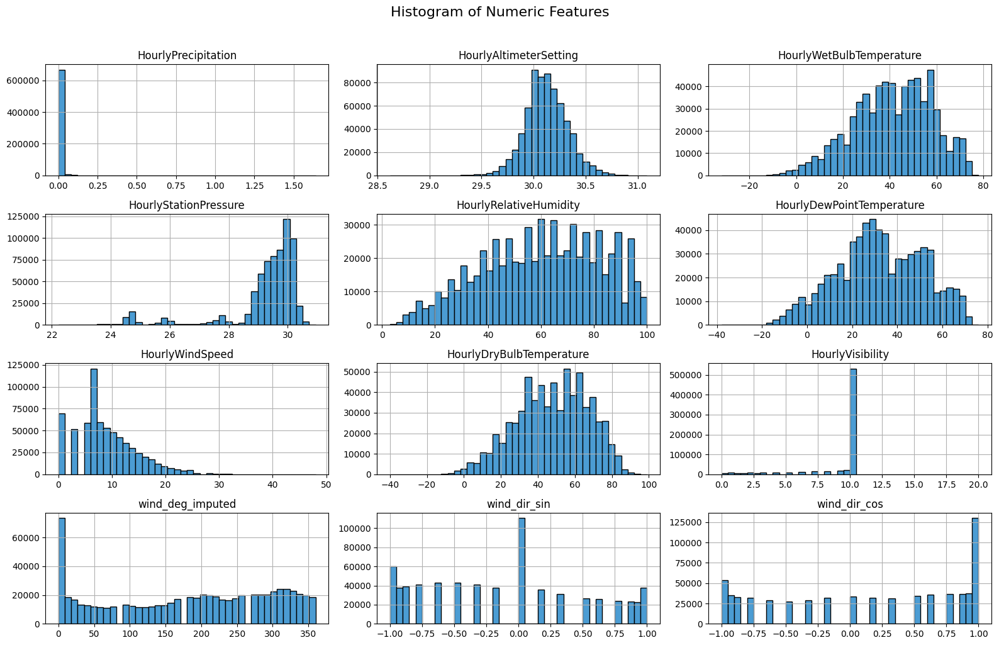

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 10))
pdf.hist(bins=40, figsize=(16, 10), layout=(4, 3), color="#4B9CD3", edgecolor="black")
plt.suptitle("Histogram of Numeric Features", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


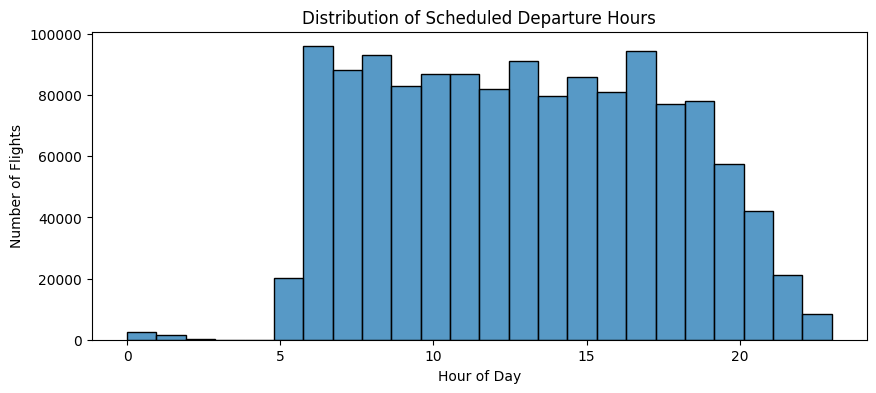

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import seaborn as sns

df_hr = df_imputed.withColumn("DEP_HOUR", F.floor(F.col("CRS_DEP_TIME")/100))
pd_df = df_hr.select("DEP_HOUR").toPandas()

plt.figure(figsize=(10,4))
sns.histplot(pd_df["DEP_HOUR"], bins=24, kde=False)
plt.title("Distribution of Scheduled Departure Hours")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Flights")
plt.show()


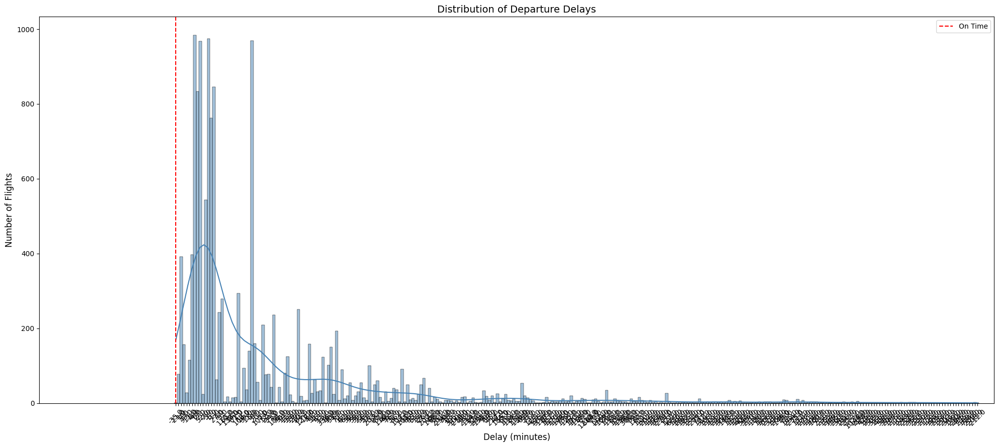

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# sample for visualization
delay_pd = df_imputed.select("DEP_DELAY").sample(fraction=0.01, seed=42).toPandas()

plt.figure(figsize=(20,9))
sns.histplot(delay_pd["DEP_DELAY"].dropna(), bins=100, kde=True, color="steelblue")

plt.title("Distribution of Departure Delays", fontsize=14)
plt.xlabel("Delay (minutes)", fontsize=12)
plt.ylabel("Number of Flights", fontsize=12)

# limit x-axis to remove extreme outliers
plt.xlim(-50, 300)
plt.xticks(rotation=45)
plt.axvline(0, color='red', linestyle='--', label='On Time')
plt.legend()
plt.tight_layout()
plt.show()
